In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import umap
import os
import seaborn as sb
from sklearn.preprocessing import StandardScaler
import umap
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
cmap = cm.nipy_spectral
from sklearn.decomposition import PCA
from label_dict import protein_to_num_single_cells, protein_to_num_full


In [3]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA/features.pth')

In [28]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_master.csv')

In [30]:
d == whole_image_as_single_cell

array(['10005_921_B9_1', '10005_921_B9_1', '10005_921_B9_1', ...,
       'dea19dc6-bbca-11e8-b2bc-ac1f6b6435d0',
       'dea19dc6-bbca-11e8-b2bc-ac1f6b6435d0',
       'dea19dc6-bbca-11e8-b2bc-ac1f6b6435d0'], dtype='<U36')

In [8]:
df_whole = pd.read_csv('/scr/mdoron/Dino4Cells/data/whole_images.csv')

In [13]:
(df_whole.ID.isin(df.ID))

0          True
1          True
2          True
3          True
4          True
          ...  
117878    False
117879    False
117880    False
117881    False
117882    False
Name: ID, Length: 117883, dtype: bool

In [22]:
df_whole.iloc[-3].ID

'fff189d8-bbab-11e8-b2ba-ac1f6b6435d0'

In [23]:
df.ID.str.contains('fff189d8-bbab-11e8-b2ba-ac1f6b6435d0').sum()

0

In [9]:
def load_and_project(path):
    data = torch.load(path)
    reducer = umap.UMAP()
    embedding = reducer.fit_transform(data[0])
    plt.figure(figsize=(6,6))
    plt.scatter(embedding[:,0], embedding[:,1], s=1)
    plt.axis('off')
    plt.show()
    return data[0], embedding

def load_and_project_rep(path, indices):
    data = torch.load(path)
    reducer = umap.UMAP(random_state=0)
    embedding = reducer.fit_transform(np.array(data[0])[indices])
    plt.figure(figsize=(6,6))
    plt.scatter(embedding[:,0], embedding[:,1], s=2)
    plt.axis('off')
    plt.show()
    return data[0], embedding

def load_and_project_michael(path):
    data = torch.load(path)
    reducer = umap.UMAP(random_state=0, init='random')
    scaled_features = StandardScaler().fit_transform(data[0])
    embedding = reducer.fit_transform(scaled_features)
    plt.figure(figsize=(6,6))
    plt.scatter(embedding[:,0], embedding[:,1], s=2)
    plt.axis('off')
    plt.show()
    return data[0], embedding


def load_and_project_pca(path):
    data = torch.load(path)
    reducer = umap.UMAP(random_state=0, init='random')
    scaled_features = StandardScaler().fit_transform(data[0])
    pca = PCA(n_components=scaled_features.shape[1])
    scaled_features = pca.fit_transform(scaled_features)
    embedding = reducer.fit_transform(scaled_features)
    plt.figure(figsize=(6,6))
    plt.scatter(embedding[:,0], embedding[:,1], s=2)
    plt.axis('off')
    plt.show()
    return data[0], embedding

def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

def plot_UMAP(df, labels, embedding, title):
    mat, labels = get_col_matrix(df, labels)
    plt.figure(figsize=(10,10))
    plt.scatter(embedding[:, 0], 
                embedding[:, 1],
                s=0.1,
                label='All data',
                color='grey'
               )
    for i in range(mat.shape[1]):
        indices = np.where((mat[:, i] == 1) & (mat[:,:].sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.1,
                    label=labels[i],
                    color=cmap(i / mat.shape[1])
                   )

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title, fontsize=30)
#     lgnd = plt.legend(bbox_to_anchor=(1,1), frameon=False)
#     for h in lgnd.legendHandles:
#         h._sizes = [30]

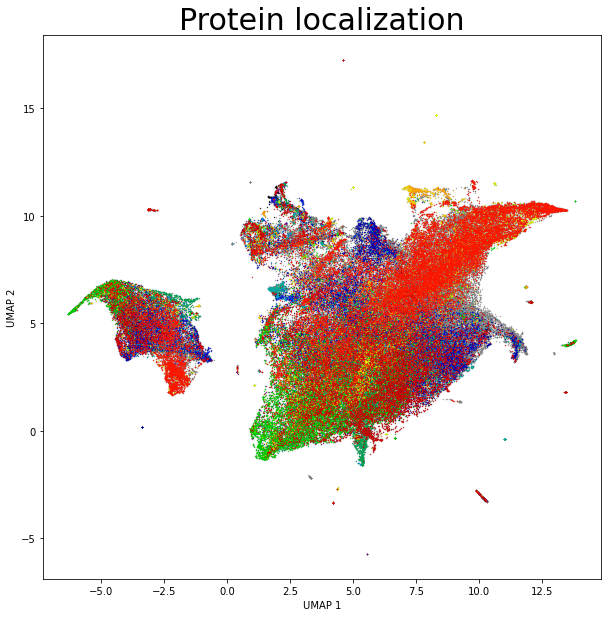

In [12]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/U2-OS_centermom_0.998_protein_channel/features.pth')
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_u2os_df.csv')
reducer = umap.UMAP(random_state=0, init='random')
scaled_features = StandardScaler().fit_transform(a)
protein_channel_embedding = reducer.fit_transform(scaled_features)
plot_UMAP(df, protein_to_num_single_cells, protein_channel_embedding, 'Protein localization')

In [13]:
df_master = pd.read_csv('/scr/mdoron/Dino4Cells/Master_scKaggle.csv')
df = pd.merge(df, df_master[['ID','gene']], on='ID')


In [41]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist
from seaborn import clustermap
from scipy.spatial.distance import squareform
from skimage import io

In [31]:
targets = torch.stack(b)

/scr/mdoron/miniconda3/lib/python3.9/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


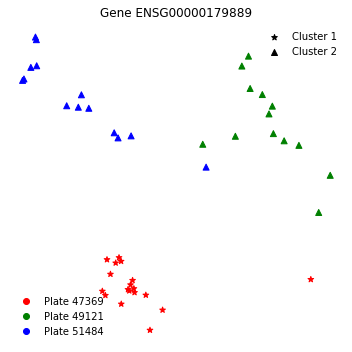

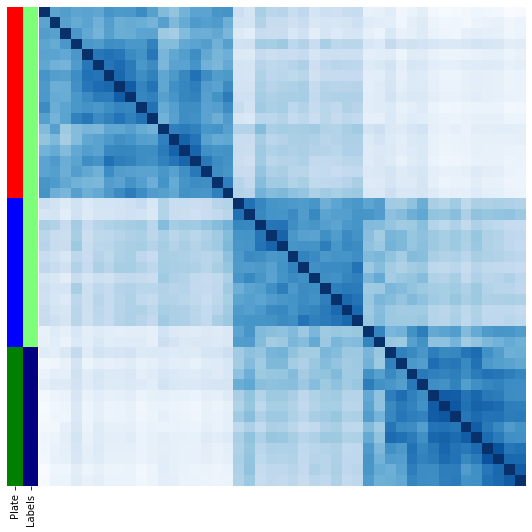

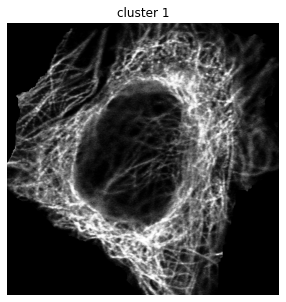

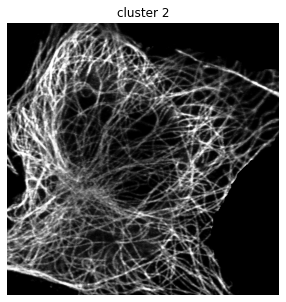

In [78]:
cmap = cm.jet

gene_dict = df.groupby('gene').groups
gene_ind = 23
t=2
gene = sorted([(g, len(gene_dict[g])) for g in gene_dict], key=lambda x:x[1])[::-1][gene_ind][0]
# gene = 'ENSG00000176697'
gene_indices = np.where(df.gene == gene)[0]
gene_df = df.iloc[gene_indices].reset_index()

# gene_df['well'] = gene_df.ID
gene_df['well'] = gene_df.ID.apply(lambda x:x.split('_')[0])


# dists = pdist(embedding[gene_indices], metric='euclidean')
dists = pdist(a[gene_indices], metric='euclidean')
Z = linkage(dists, 'ward')
clusters = fcluster(Z, criterion='maxclust', t=t)

fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.title(f'Gene {gene}')

channels = [0]
markers = ['*','^','o','|','v','s']
wells = np.unique(gene_df.well)
colors = {wells[i] : 'rgbkym'[i] for i in range(len(wells))}
markers = {i : markers[i - 1] for i in np.unique(clusters)}

for label in np.unique(clusters):
    indices = np.where(clusters == label)[0]
    gene_df.loc[indices,'cluster'] = label
    
for cluster in range(1, max(clusters) + 1):
    indices = np.where(clusters == cluster)[0]
    plt.scatter(embedding[gene_indices][indices,0], 
                embedding[gene_indices][indices,1],
                marker=markers[cluster],
                c=[colors[i] for i in gene_df.iloc[indices].well],
               label=f'Cluster {cluster}')

ax2 = ax.twinx()
for w in wells:
    ax2.scatter(np.NaN, np.NaN, color=colors[w], label=f'Plate {w}', marker = 'o')
ax2.get_yaxis().set_visible(False)

lgnd = ax.legend(frameon=False, scatterpoints=1, fontsize=10, loc='upper right')
for h in lgnd.legendHandles:
    h._original_facecolor = 'black'
ax2.legend(frameon=False, loc='lower left')

ax.axis('off')
ax2.axis('off')
plt.tight_layout()

lut = dict(zip(gene_df['well'].unique(), 'rgbk'))
row_colors1 = gene_df['well'].map(lut)
row_colors1.name = 'Plate'

# b = ((cell_preds[gene_indices])).astype(int)
# c1 = [str(list(i)) for i in b]
# series = pd.DataFrame(c1)[0]
# series.name = 'Prediction'
# lut1 = dict(zip(np.unique(c1), [cmap(i / len(np.unique(c1))) for i in range(len(np.unique(c1)))]))
# row_colors2 = series.map(lut1)

b = ((targets[gene_indices]).numpy()).astype(int)
c2 = [str(list(i)) for i in b]
lut1 = dict(zip(np.unique(c2), [cmap(i / len(np.unique(c2))) for i in range(len(np.unique(c2)))]))
series = pd.DataFrame(c2)[0]
series.name = 'Labels'
row_colors3 = series.map(lut1)

row_colors = pd.concat([row_colors1,row_colors3],axis=1)
# row_colors = pd.concat([row_colors1,row_colors2,row_colors3],axis=1)

c = clustermap(pd.DataFrame(squareform(dists)),
               figsize=(7.5,7.5),
               cbar_pos=None, 
               xticklabels=[], 
               yticklabels=[], 
               cmap='Blues_r', 
               dendrogram_ratio=[0,0],
               col_cluster=True,
               row_cluster=True,
               row_colors = row_colors,
               cbar_kws={"size": 20}
)
# c.ax_row_colors.set_xlabel('Well', fontsize=18, rotation=90)

for cluster in np.unique(clusters):
    plt.figure(figsize=(5,5))
    plt.imshow(io.imread(gene_df[(gene_df.cluster == cluster)].file.iloc[0])[:,:,channels], cmap='Greys_r', vmin=0, vmax=255)
    plt.grid(None)
    plt.axis('off')
    plt.title(f'cluster {cluster}')


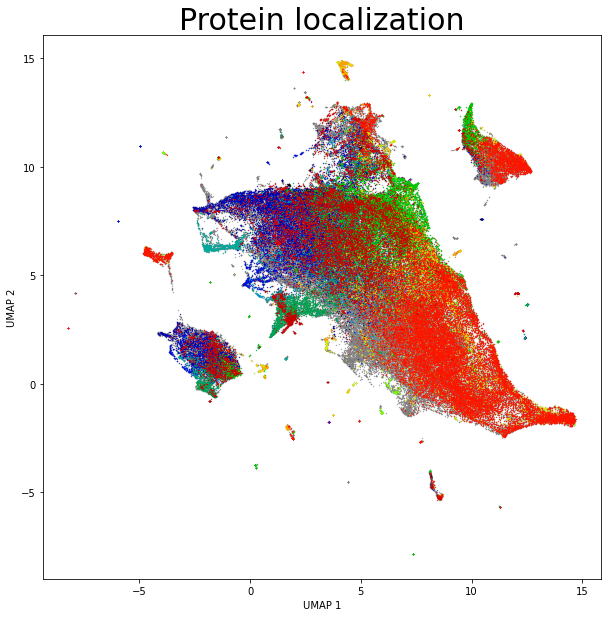

In [10]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/U2-OS_centermom_0.998/features.pth')
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_u2os_df.csv')
reducer = umap.UMAP(random_state=0, init='random')
scaled_features = StandardScaler().fit_transform(a)
embedding = reducer.fit_transform(scaled_features)
plot_UMAP(df, protein_to_num_single_cells, embedding, 'Protein localization')

In [ ]:
_, embedding_all = load_and_project('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA/features.pth')


In [4]:
_, embedding_all = load_and_project_michael('/scr/mdoron/Dino4Cells/models/koleo_0.010/features.pth')


ValueError: On entry to DHSEQR parameter number 4 had an illegal value

<Figure size 432x432 with 1 Axes>

In [7]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_master_A549.csv')

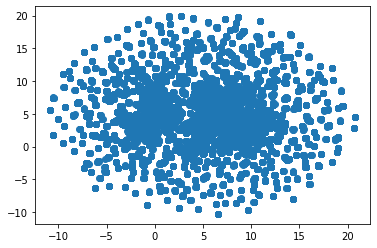

In [5]:
plt.scatter(embedding_all[:,0],
            embedding_all[:,1])

In [31]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA/features.pth')

In [32]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_for_whole_image.csv')

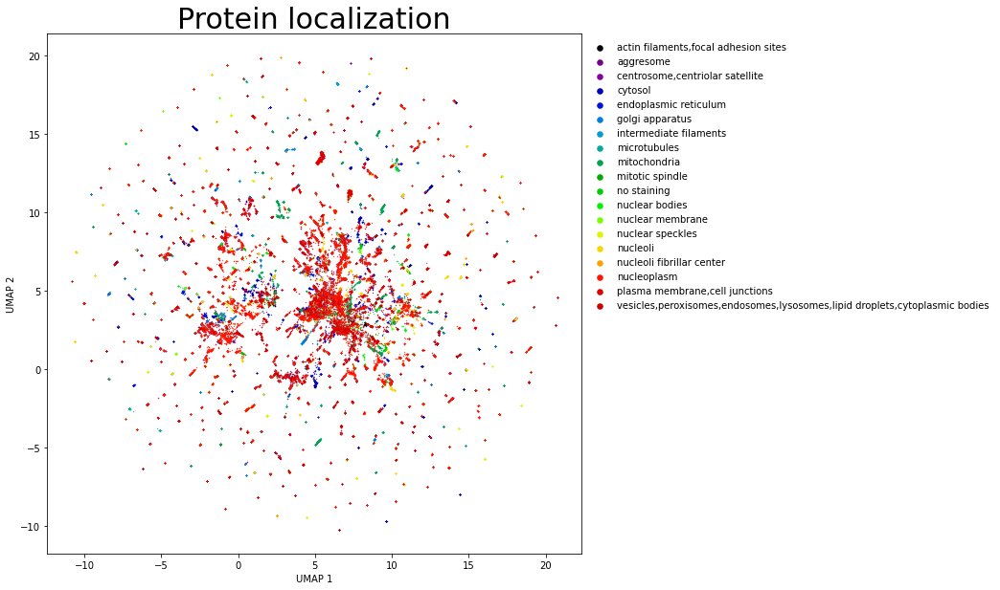

In [8]:
plot_UMAP(df, protein_to_num_single_cells, embedding_all, 'Protein localization')

In [10]:
from tqdm import tqdm

In [ ]:
radius = ["0.100", "0.010", "0.200", "0.500"]
proba = ["1.000", "0.100", "0.500"]

koleo = ["0.010", "0.050", "0.100", "0.200"]
koleo_embeddings = []
koleo_titles = []
for k in tqdm(koleo):
    try:
        path = f'/scr/mdoron/Dino4Cells/models/koleo_{k}/features.pth'
        data = torch.load(path)
        reducer = umap.UMAP(random_state=0, init='random')
        scaled_features = StandardScaler().fit_transform(data[0])
        embedding = reducer.fit_transform(scaled_features)
        koleo_embeddings.append(embedding)
        koleo_titles.append(f'koleo_{k}')
    except:
        pass

 25%|██████████████████████████████████████████▎                                                                                                                              | 1/4 [00:25<01:15, 25.13s/it]

In [64]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_A549_master.csv')

4it [00:00, 21.16it/s]


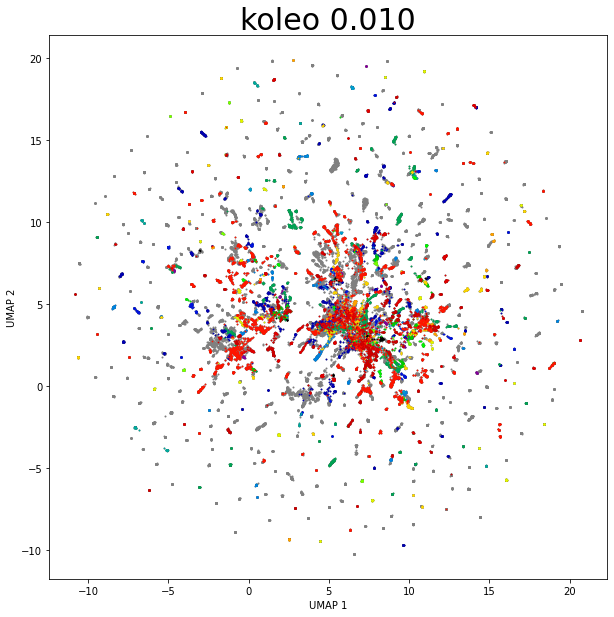

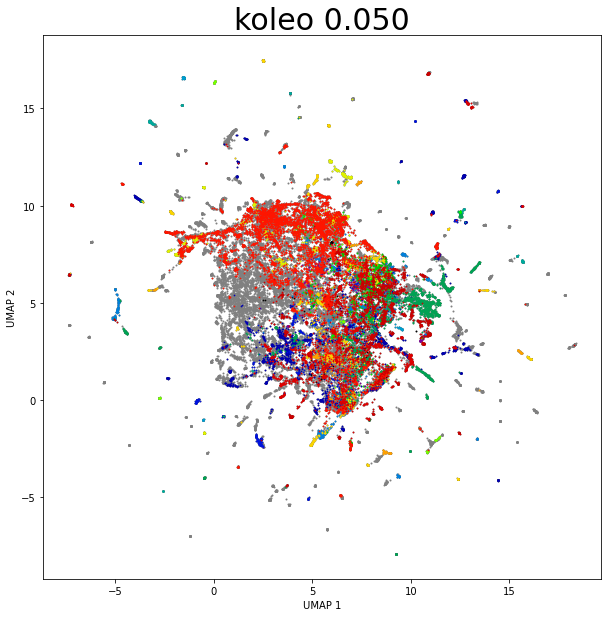

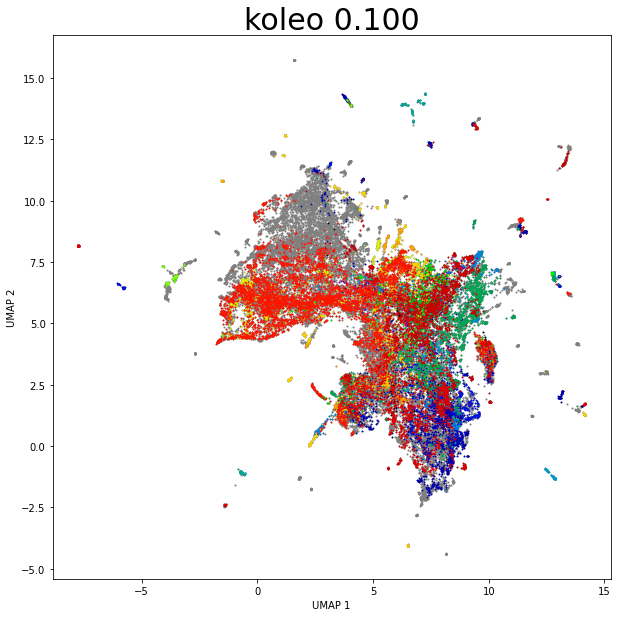

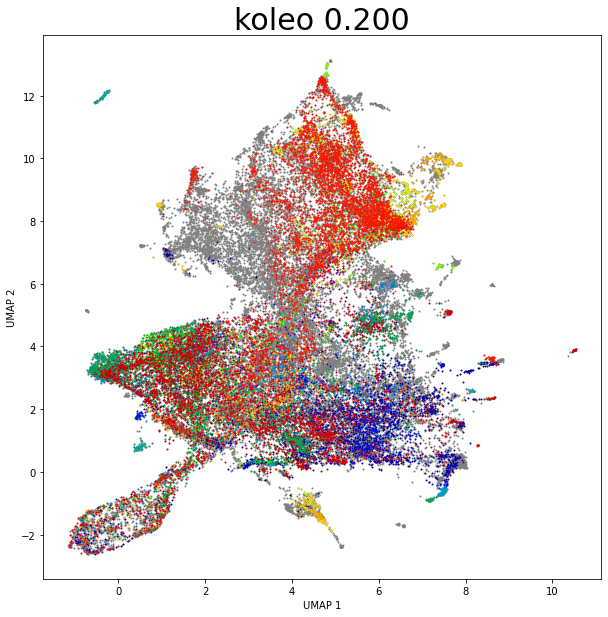

In [67]:
for ind, k in tqdm(enumerate(koleo)):
    mat, labels = get_col_matrix(df, protein_to_num_single_cells)
    plt.figure(figsize=(10,10))
    embedding = koleo_embeddings[ind]
    plt.scatter(embedding[:, 0], 
                embedding[:, 1],
                s=1,
                label='All data',
                color='grey'
               )
    for i in range(mat.shape[1]):
        indices = np.where((mat[:, i] == 1) & (mat[:,:].sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.5,
                    label=labels[i],
                    color=cmap(i / mat.shape[1])
                   )
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(f'koleo {k}', fontsize=30)    

In [70]:
koleo = ["0.050", "0.100", "0.200"]
# koleo_all_embeddings = []
# koleo_all_titles = []
for k in tqdm(koleo):
    try:
        path = f'/scr/mdoron/Dino4Cells/models/koleo_{k}_all/features.pth'
        data = torch.load(path)
        reducer = umap.UMAP(random_state=0, init='random')
        scaled_features = StandardScaler().fit_transform(data[0])
        embedding = reducer.fit_transform(scaled_features)
        koleo_all_embeddings.append(embedding)
        koleo_all_titles.append(f'koleo_all_{k}')
    except:
        pass

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [48:34<00:00, 971.42s/it]


In [74]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_master.csv')

4it [00:33,  8.40s/it]


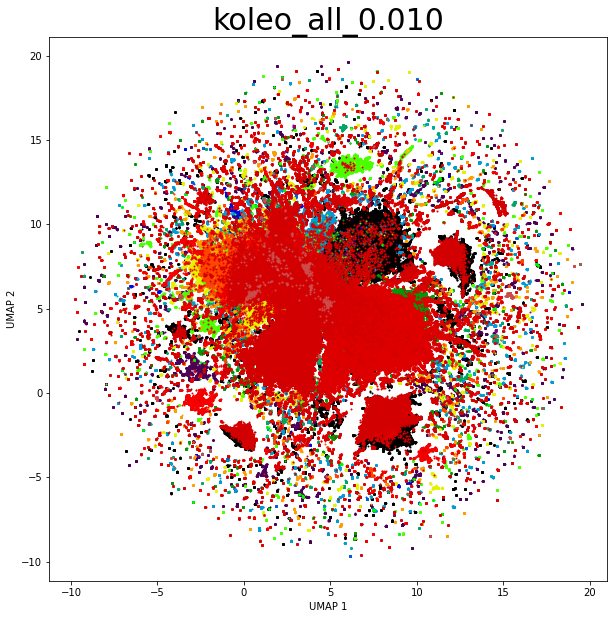

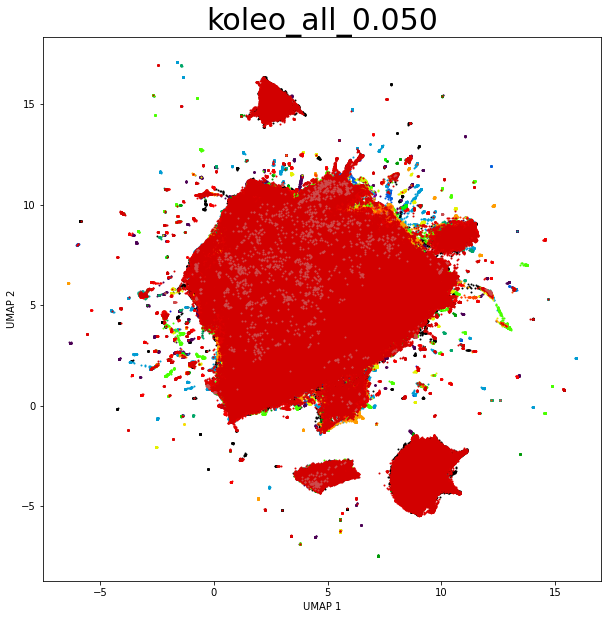

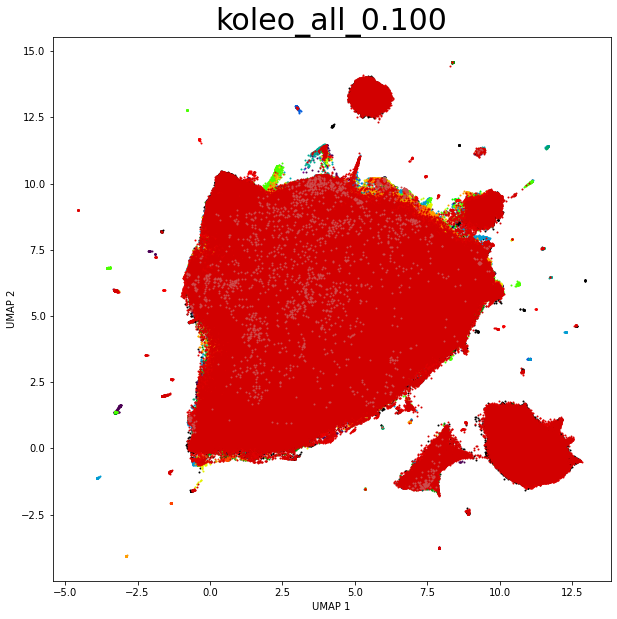

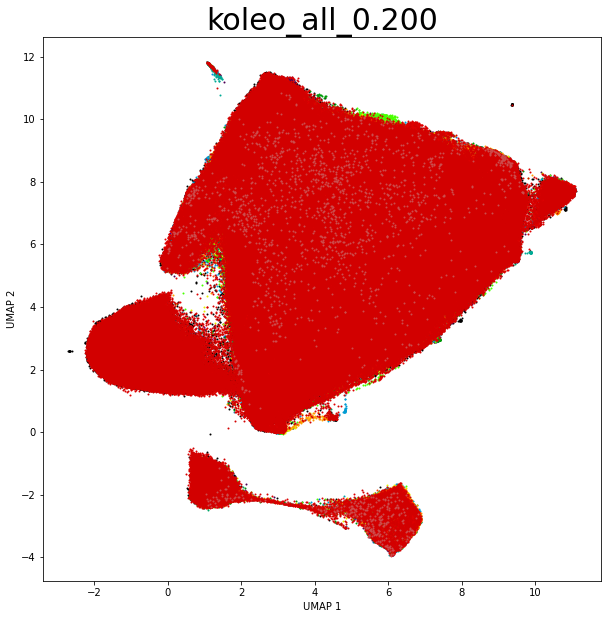

In [75]:
for ind, k in tqdm(enumerate(koleo_all_embeddings)):
    mat, labels = get_col_matrix(df, ['cell_type'])
    plt.figure(figsize=(10,10))
    embedding = koleo_all_embeddings[ind]
    for i in range(mat.shape[1]):
        indices = np.where(mat[:, i])[0]
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=1,
                    label=labels[i],
                    color=cmap(i / mat.shape[1])
                   )
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(koleo_all_titles[ind], fontsize=30)    

4it [00:08,  2.09s/it]


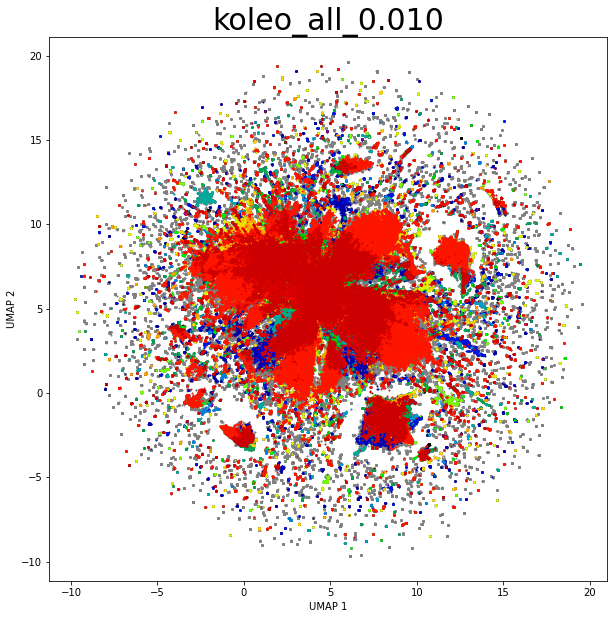

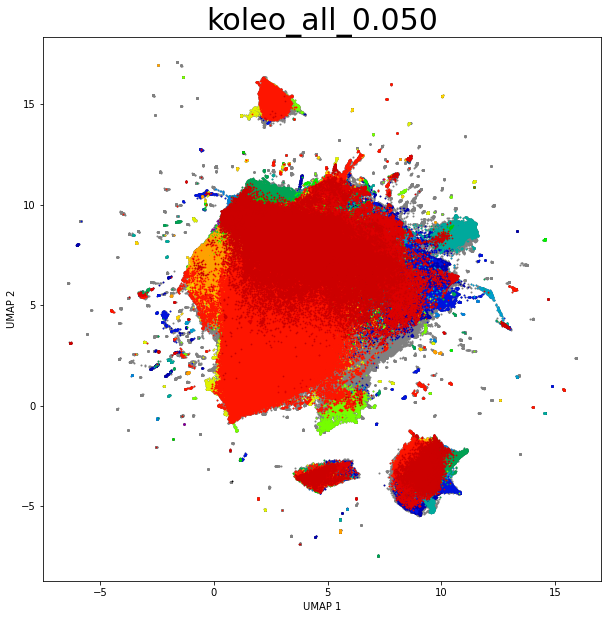

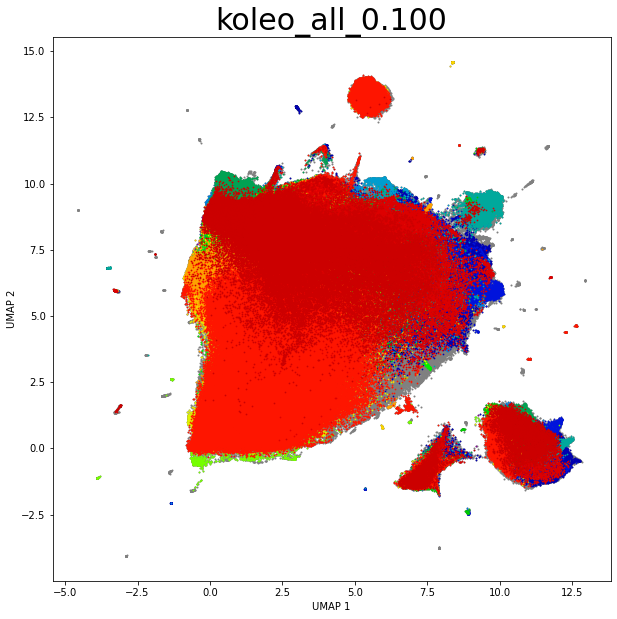

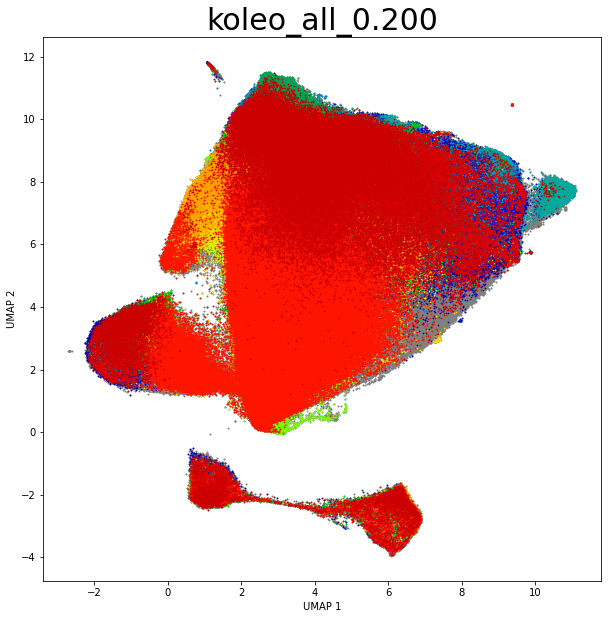

In [76]:
for ind, k in tqdm(enumerate(koleo_all_titles)):
    mat, labels = get_col_matrix(df, protein_to_num_single_cells)
    plt.figure(figsize=(10,10))
    embedding = koleo_all_embeddings[ind]
    plt.scatter(embedding[:, 0], 
                embedding[:, 1],
                s=1,
                label='All data',
                color='grey'
               )
    for i in range(mat.shape[1]):
        indices = np.where((mat[:, i] == 1) & (mat[:,:].sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0], 
                    embedding[indices, 1],
                    s=0.5,
                    label=labels[i],
                    color=cmap(i / mat.shape[1])
                   )
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(f'{k}', fontsize=30)    

In [21]:
centermom = ["0.880", "0.920", "0.860", "0.940", "0.960"]

centermom_embeddings = []
for k in tqdm(centermom):
    path = f'/scr/mdoron/Dino4Cells/models/centermom_{k}/features.pth'
    data = torch.load(path)
    reducer = umap.UMAP(random_state=0, init='random')
    scaled_features = StandardScaler().fit_transform(data[0])
    embedding = reducer.fit_transform(scaled_features)
    centermom_embeddings.append(embedding)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:12<00:00, 26.47s/it]


5it [00:00, 24.68it/s]


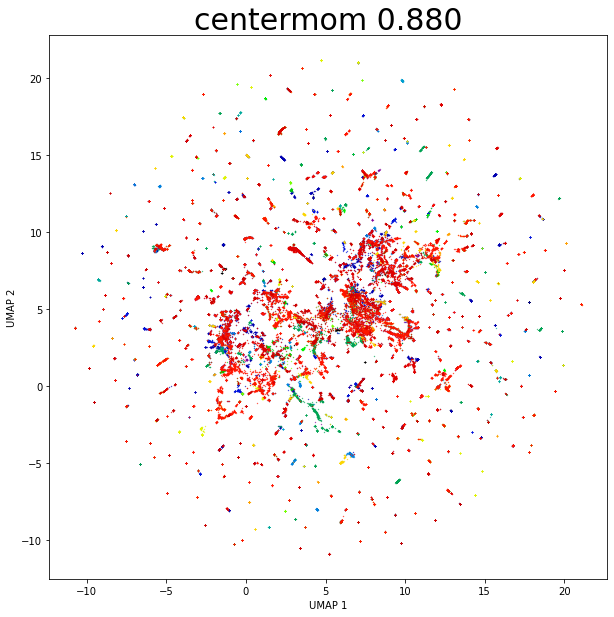

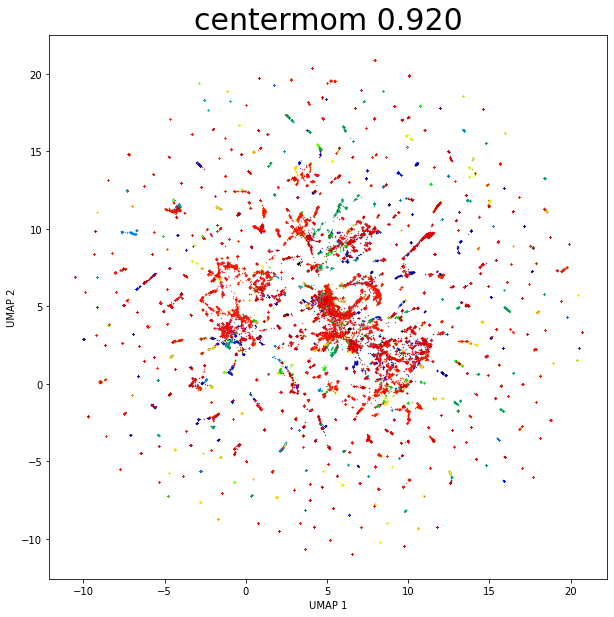

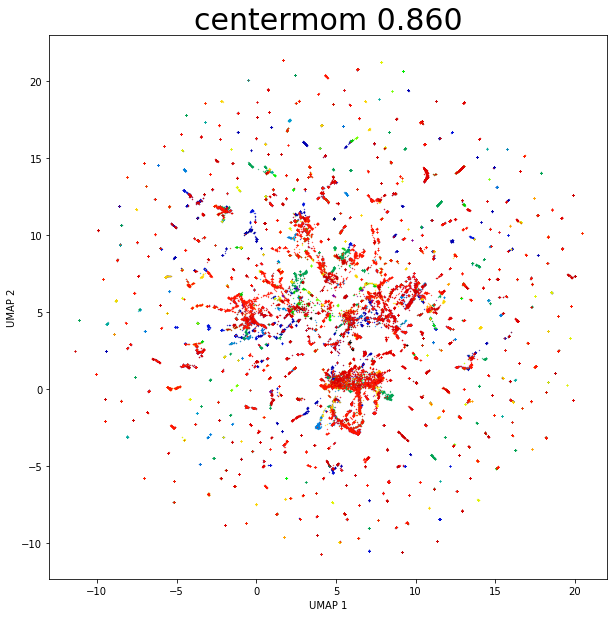

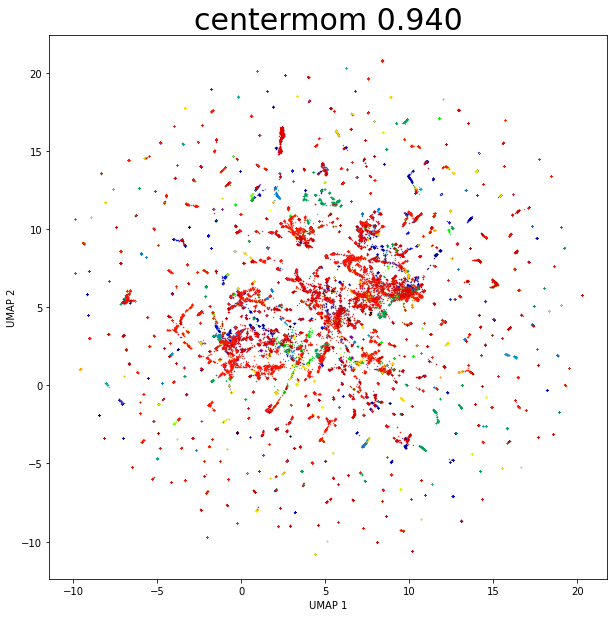

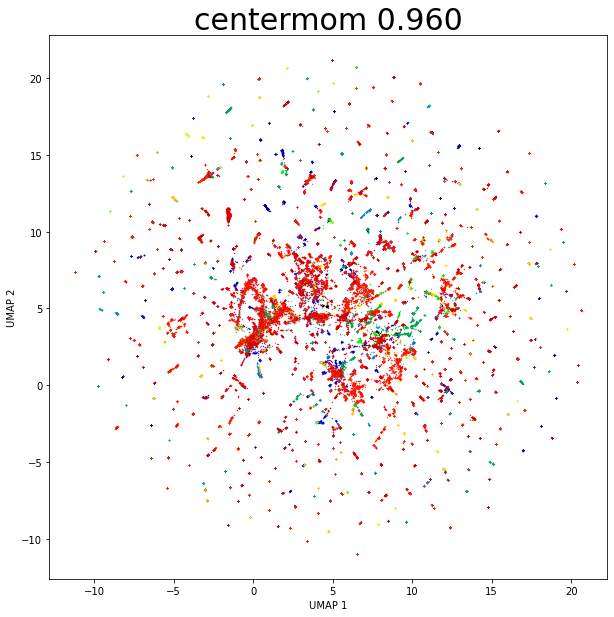

In [35]:
for ind, k in tqdm(enumerate(centermom)):
    plot_UMAP(df, protein_to_num_single_cells, centermom_embeddings[ind], f'centermom {k}')

In [29]:
radius = ["0.100", "0.010", "0.200", "0.500"]
proba = ["1.000", "0.100", "0.500"]
radius_proba_embeddings = []
radius_proba_titles = []
for k in tqdm(radius):
    for p in tqdm(proba):
        try;
            path = f'/scr/mdoron/Dino4Cells/models/radius_{k}_proba_{p}/features.pth'
            data = torch.load(path)
            reducer = umap.UMAP(random_state=0, init='random')
            scaled_features = StandardScaler().fit_transform(data[0])
            embedding = reducer.fit_transform(scaled_features)
            radius_proba_embeddings.append(embedding)
            radius_proba_titles.append(f'radius_{k}_proba_{p}')
        except:
            pass

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 3/4 [03:42<01:14, 74.11s/it]


FileNotFoundError: [Errno 2] No such file or directory: '/scr/mdoron/Dino4Cells/models/radius_0.500_proba_1.000/features.pth'

In [31]:
radius = ["0.100", "0.010", "0.200", "0.500"]
proba = ["1.000", "0.100", "0.500"]
radius_proba_titles = []
for k in tqdm(radius):
    for p in tqdm(proba):
        try:
            path = f'/scr/mdoron/Dino4Cells/models/radius_{k}_proba_{p}/features.pth'
            data = torch.load(path)
            radius_proba_titles.append(f'radius_{k}_proba_{p}')
        except:
            pass

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:06<00:00,  1.69s/it]


9it [00:01,  8.80it/s]


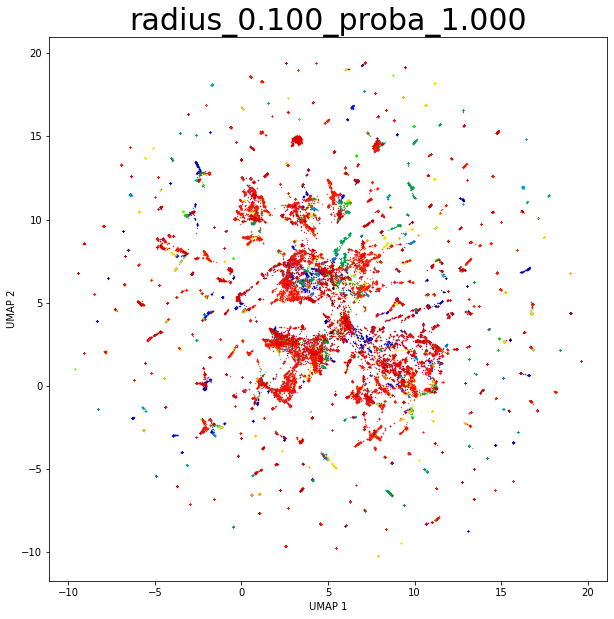

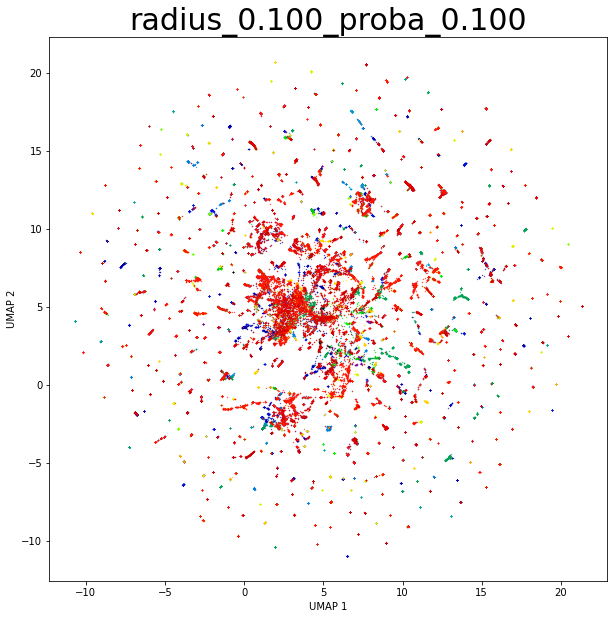

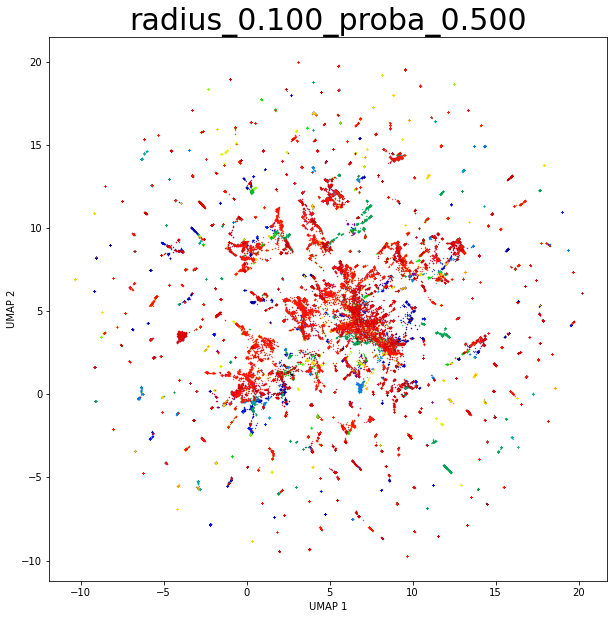

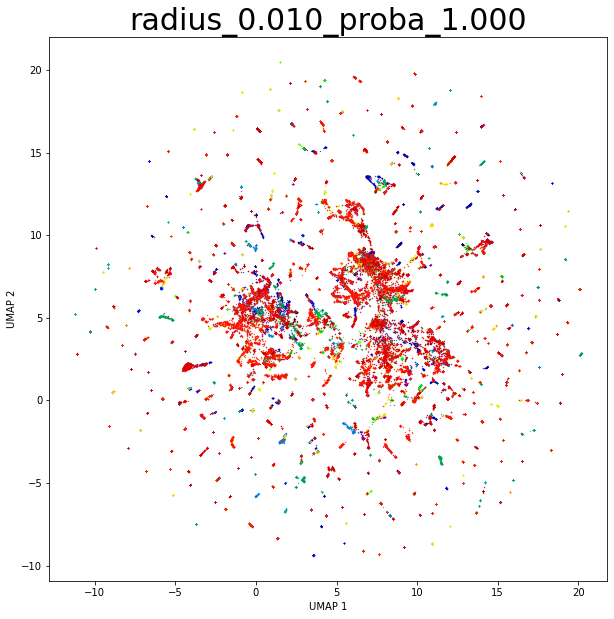

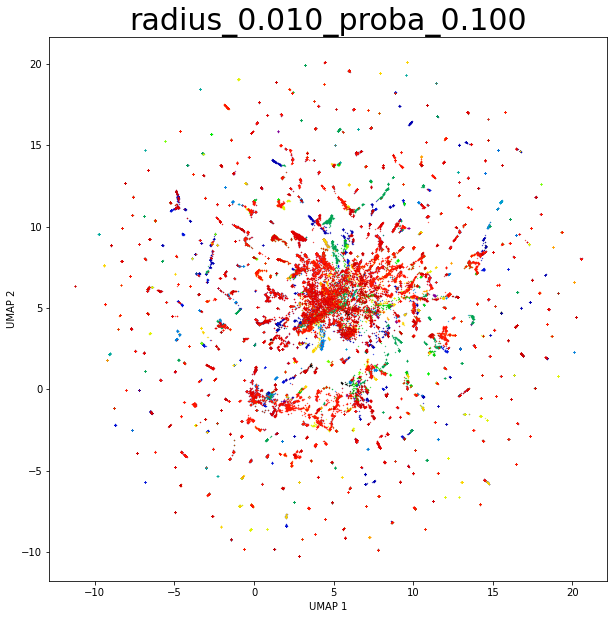

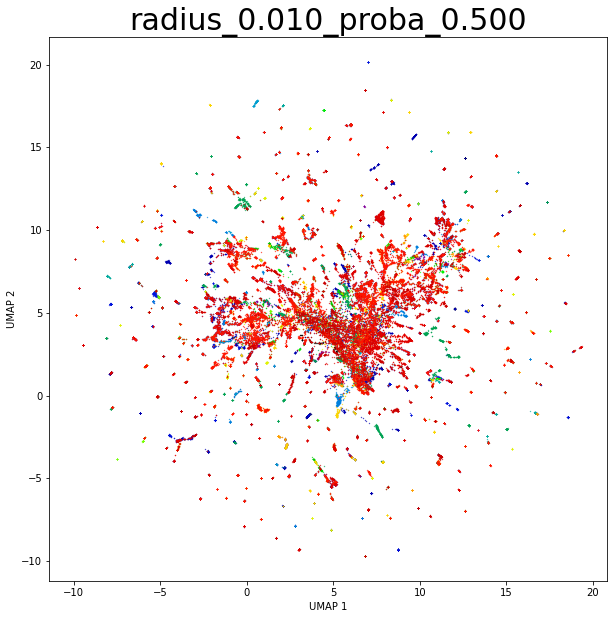

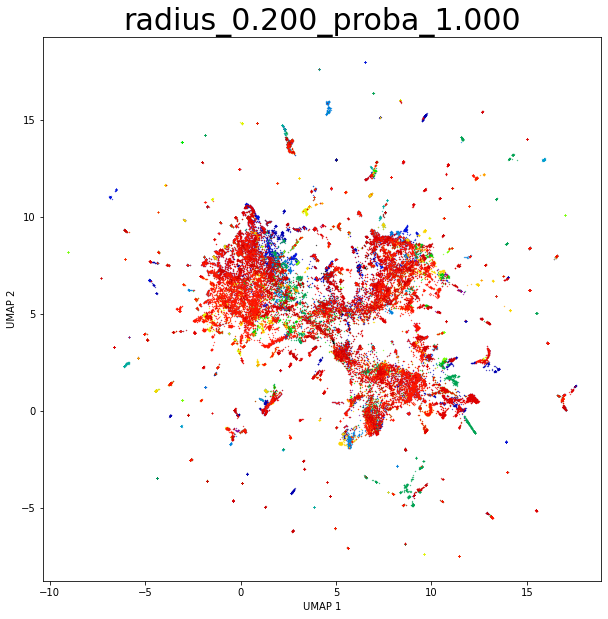

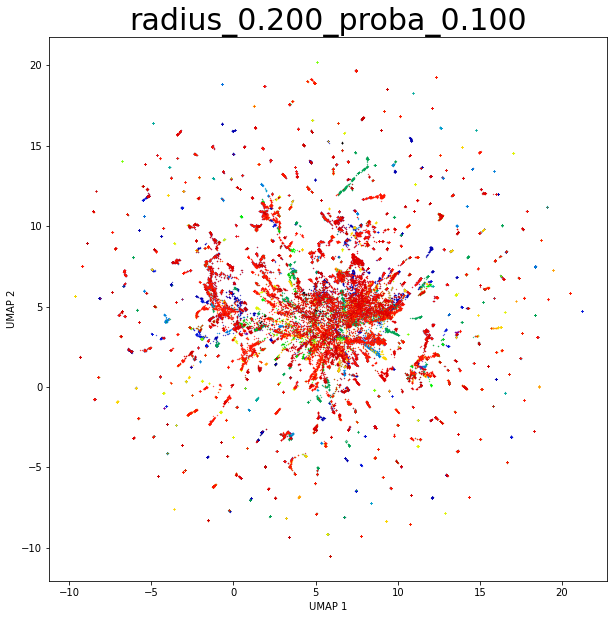

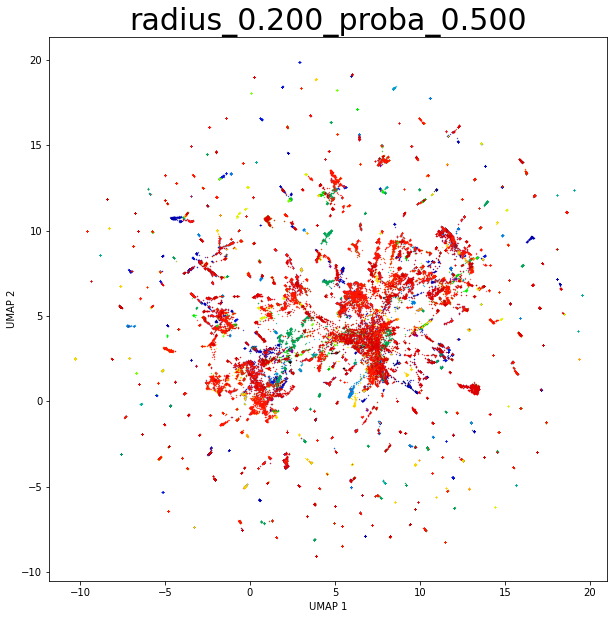

In [33]:
for ind, k in tqdm(enumerate(radius_proba_embeddings)):
    plot_UMAP(df, protein_to_num_single_cells, radius_proba_embeddings[ind], radius_proba_titles[ind])

In [42]:
bb = df[sorted(protein_to_num_full.keys())].values.astype(int)

In [46]:
torch.save((a,bb,c,d), '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images/features.pth')


In [101]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/valid_features.pth')


In [102]:
a = torch.Tensor(a)

In [103]:
torch.save((a,b,c,d), '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/valid_features.pth')


In [130]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/train_features.pth')
train_proteins = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(b, columns=[i for i in range(b.shape[1])])), axis=1).groupby('ID').mean().values
train_cells = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(c, columns=['cell_type'])), axis=1).groupby('ID').first().values[:,0]
train_features = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(a, columns=[i for i in range(768)])), axis=1).groupby('ID').mean().values

In [132]:
torch.save((torch.Tensor(train_features), train_proteins, train_cells, sorted(np.unique(d))), '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/train_features.pth')


In [133]:
a,b,c,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/valid_features.pth')
valid_proteins = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(b, columns=[i for i in range(b.shape[1])])), axis=1).groupby('ID').mean().values
valid_cells = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(c, columns=['cell_type'])), axis=1).groupby('ID').first().values[:,0]
valid_features = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(a, columns=[i for i in range(768)])), axis=1).groupby('ID').mean().values


In [134]:
torch.save((torch.Tensor(valid_features), valid_proteins, valid_cells, sorted(np.unique(d))), '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked/valid_features.pth')


In [135]:
a,b,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked//test_features.pth')


In [136]:
train_features = pd.concat((pd.DataFrame(b, columns=['ID']), pd.DataFrame(a, columns=[i for i in range(768)])), axis=1).groupby('ID').mean().values


In [137]:
torch.save(((torch.Tensor(train_features), sorted(np.unique(b)), d[:len(train_features)])), 
           '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images_unmasked//test_features.pth')


torch.Size([239418, 768])

In [106]:
a,b,d = torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA/test_features.pth')
train_features = pd.concat((pd.DataFrame(d, columns=['ID']), pd.DataFrame(a, columns=[i for i in range(768)])), axis=1).groupby('ID').mean().values

In [114]:
a

tensor([[ 1.1092,  0.8820, -1.3204,  ..., -0.6540, -0.4851, -0.2206],
        [-0.1960, -0.4343, -2.1584,  ...,  0.1883, -0.8672, -0.0584],
        [-1.1106,  1.4461, -0.2318,  ...,  0.8884,  1.0114, -0.9810],
        ...,
        [-1.1766, -0.3379, -0.1992,  ..., -1.4255, -2.4734, -0.9002],
        [-2.7840,  0.9279,  0.4779,  ..., -1.1819,  0.5194, -2.0225],
        [ 0.0032,  0.3769, -1.2977,  ..., -0.5548, -1.0816, -2.0464]])

In [ ]:
torch.save((valid_features, valid_proteins, valid_cells, sorted(np.unique(d))), '/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA_whole_images/valid_features.pth')


In [96]:
torch.load('/scr/mdoron/Dino4Cells/models/without-norm-varied-masked-mom-0.996-epoch-100_vit_base_HPA/test_features.pth')[0].shape



torch.Size([10710, 768])

In [97]:
a.shape

torch.Size([18028, 768])

In [75]:
train_features.shape

(72144, 768)

In [5]:
protein_matrix = torch.stack(b)


In [18]:
features = a.numpy()
features = ((features - features.mean(axis=0)) / features.std(axis=0))


In [13]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_A549_master.csv')

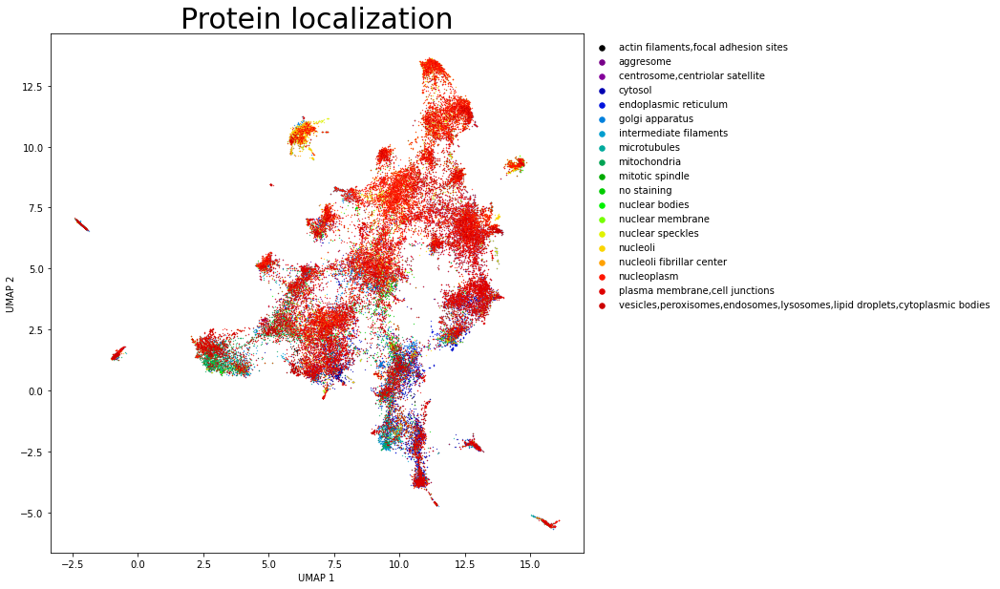

In [15]:
plot_UMAP(df, protein_to_num_single_cells, embedding, 'Protein localization')

In [19]:
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(features)


/scr/mdoron/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


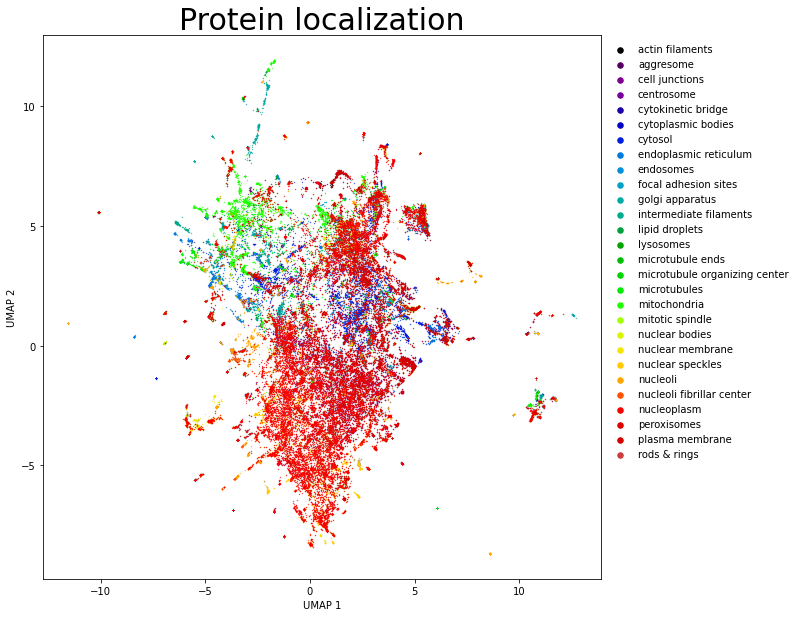

In [120]:
plot_UMAP(df, protein_to_num_full, inversed_embedding, 'Protein localization')

In [103]:
from scipy import linalg as LA
features = ((features - features.mean(axis=0)) / features.std(axis=0))
cov = np.cov(features, rowvar = False)
evals , evecs = LA.eigh(cov)
idx = np.argsort(evals)[::-1]
evecs = evecs[:,idx]
evals = evals[idx]

In [104]:
from tqdm import tqdm
inversed_embeddings = []
for used_PCs in tqdm([evecs, evecs[:,10:], evecs[:,:10], evecs[:,:100]]):
    transformed_features = np.dot(features, used_PCs) 
    reversed_features = np.dot(transformed_features, used_PCs.T)
    reducer = umap.UMAP()
    inversed_embedding = reducer.fit_transform(transformed_features)
    inversed_embeddings.append(inversed_embedding)
#     plot_UMAP(df, protein_to_num_single_cells, inversed_embedding, 'Protein localization')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:23<00:00, 20.93s/it]


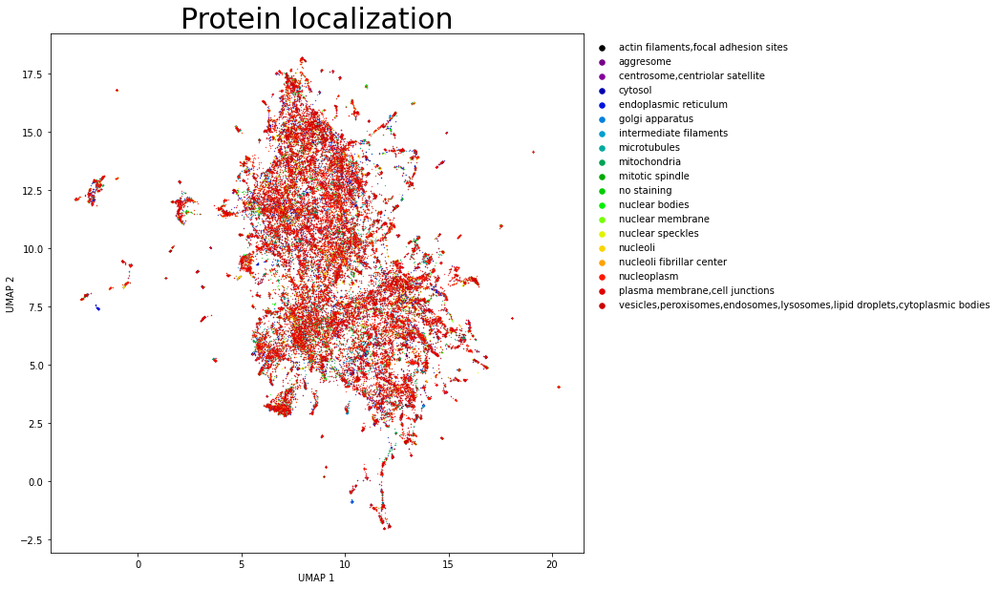

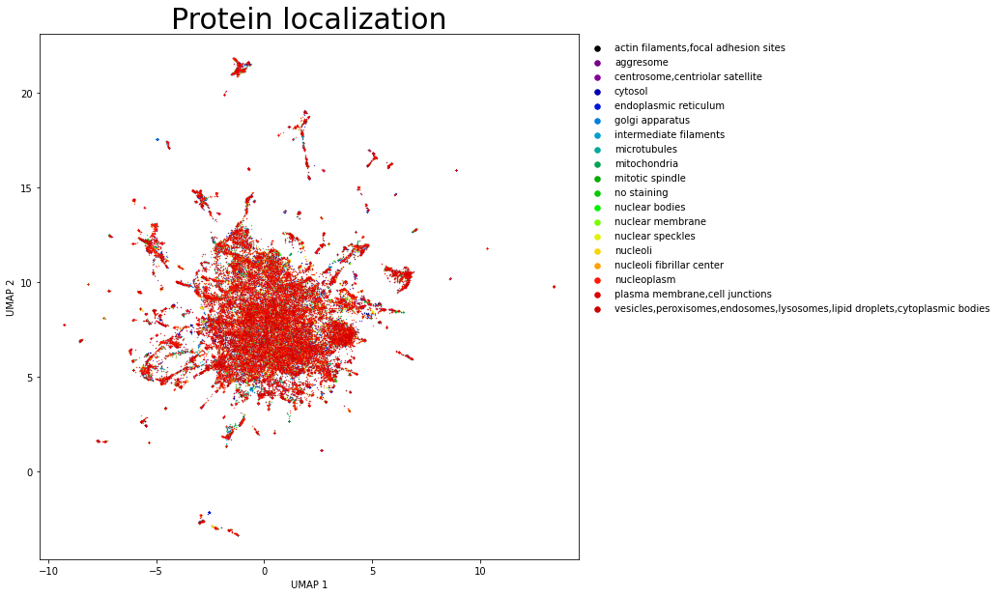

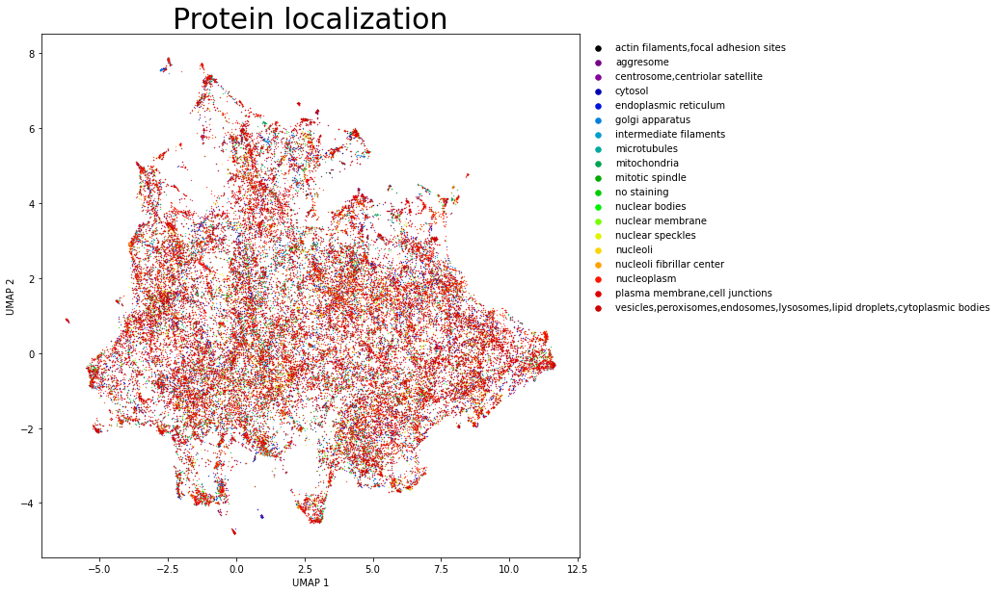

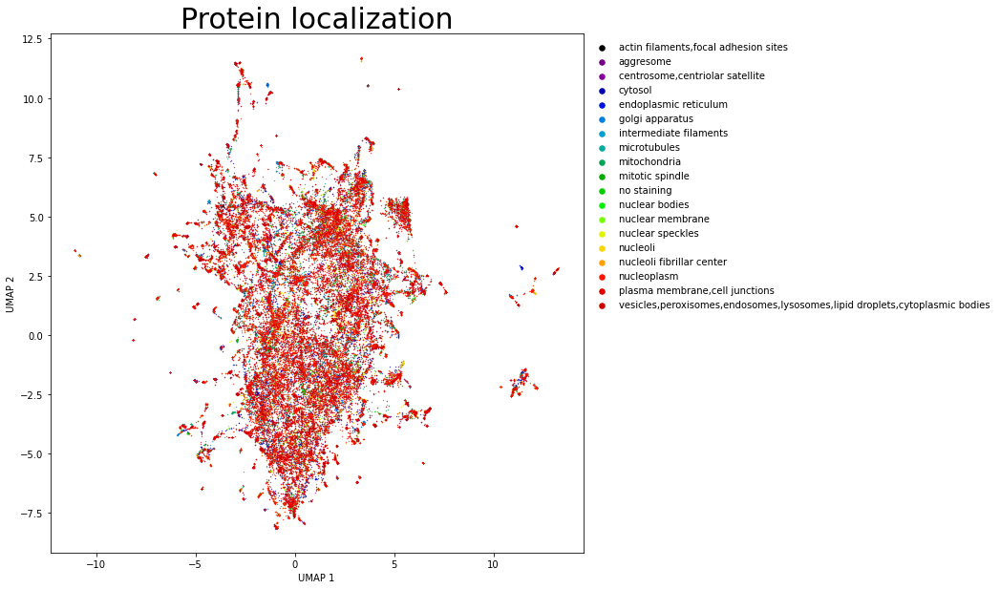

In [105]:
for i in range(4):
    plot_UMAP(df, protein_to_num_single_cells, inversed_embeddings[i], 'Protein localization')

In [106]:
from tqdm import tqdm
for used_PCs in tqdm([evecs[:,:20]]):
    transformed_features = np.dot(features, used_PCs) 
    reversed_features = np.dot(transformed_features, used_PCs.T)
    reducer = umap.UMAP()
    inversed_embedding = reducer.fit_transform(transformed_features)
    inversed_embeddings.append(inversed_embedding)
#     plot_UMAP(df, protein_to_num_single_cells, inversed_embedding, 'Protein localization')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:20<00:00, 20.40s/it]


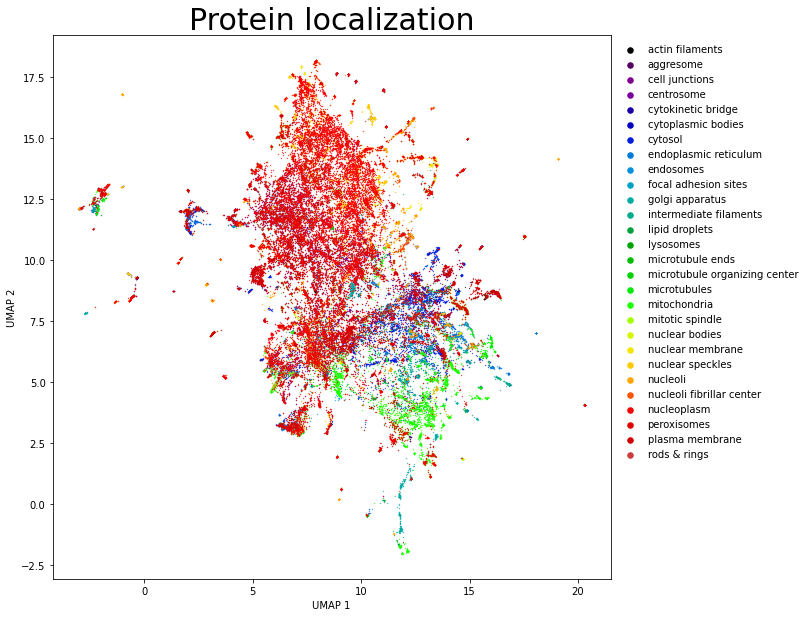

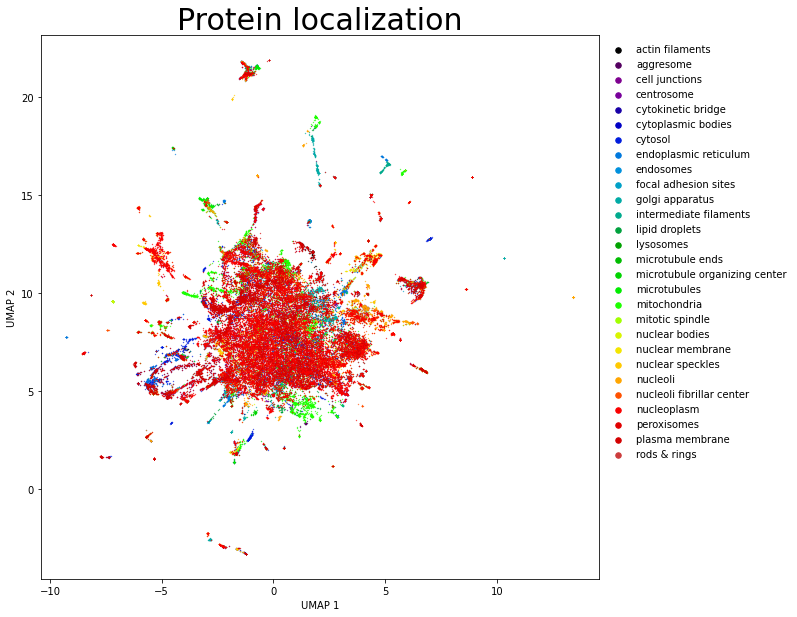

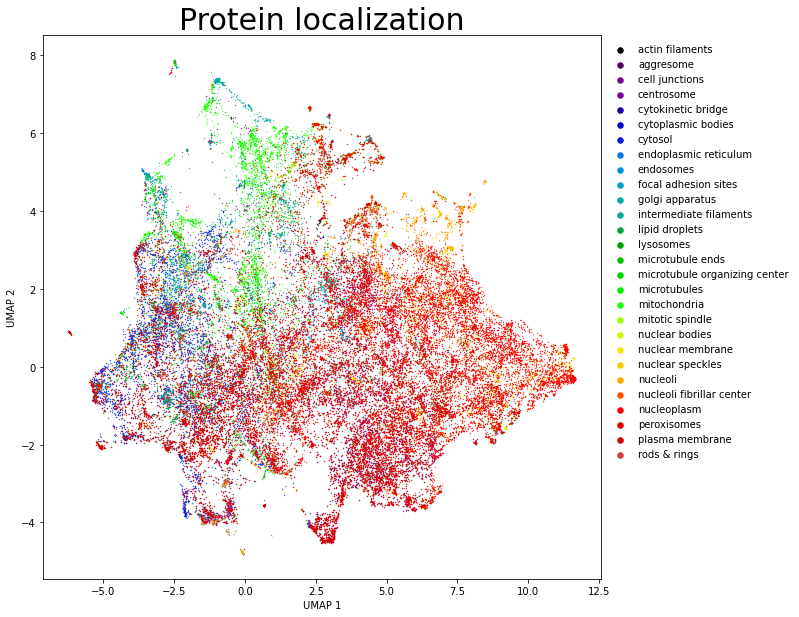

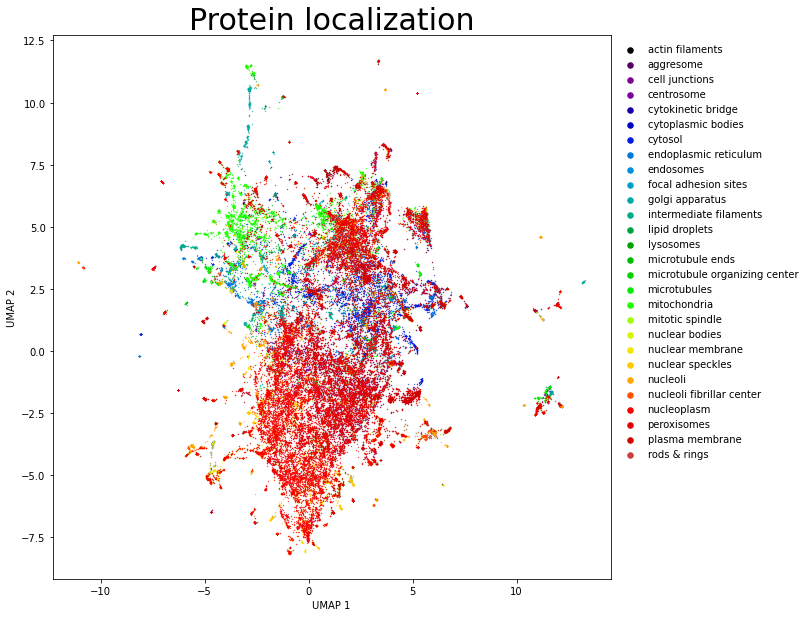

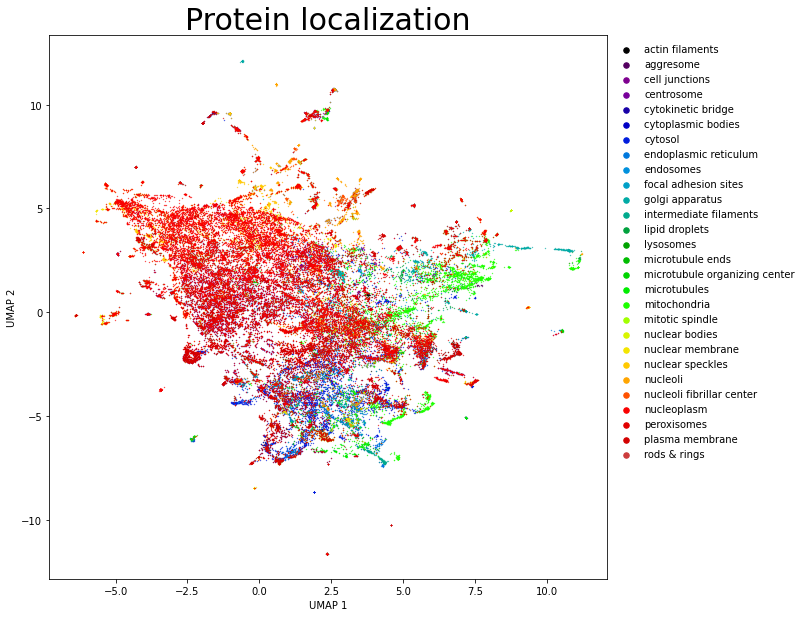

In [121]:
for i in range(5):
    plot_UMAP(df, protein_to_num_full, inversed_embeddings[i], 'Protein localization')

In [20]:
# First, remove large cluster in the middle
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=0.1, min_samples=2).fit(inversed_embedding)
cluster_sizes = {c : len(np.where(clustering.labels_ == c)[0]) for c in np.unique(clustering.labels_)}
# clusters = fcluster(Z, 500, criterion='distance')
clusters = clustering.labels_


In [21]:
cluster_groups = pd.DataFrame(clusters).groupby(0).groups

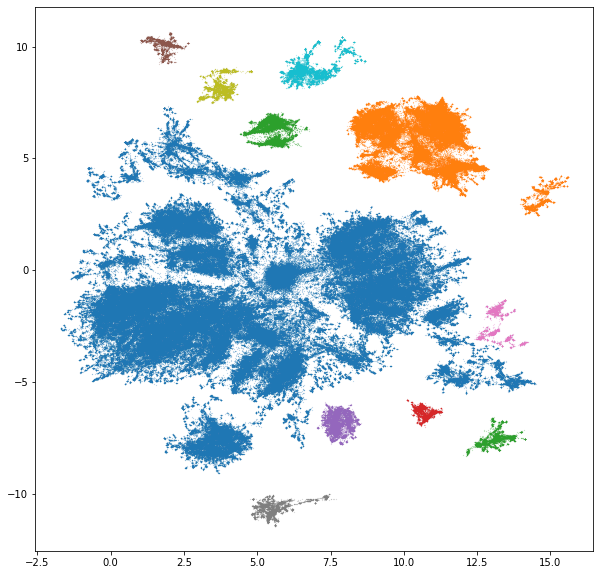

In [22]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
main_cluster_inds = []
isolated_cluster_inds = []
for g in cluster_groups:
    indices = cluster_groups[g]
    if g == -1: 
        isolated_cluster_inds.extend(indices)
        continue
    if len(indices) > 5000:
        plt.scatter(inversed_embedding[indices,0],
                    inversed_embedding[indices,1],
                    s=0.01)
        main_cluster_inds.extend(indices)
    else:
        isolated_cluster_inds.extend(indices)
        

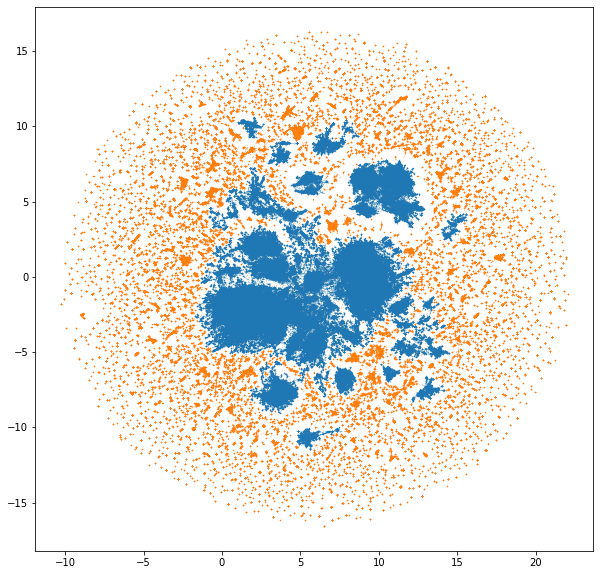

In [23]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
plt.scatter(inversed_embedding[main_cluster_inds,0],
            inversed_embedding[main_cluster_inds,1],
            s=0.01)
plt.scatter(inversed_embedding[isolated_cluster_inds,0],
            inversed_embedding[isolated_cluster_inds,1],
            s=0.01)


In [24]:
df['cluster'] = clusters

In [25]:
import harmonypy as hm
df['cluster'] = df['cluster'].astype(str)

In [ ]:
ho = hm.run_harmony(features, df, ['cluster'])

2022-12-14 04:12:31,896 - harmonypy - INFO - Iteration 1 of 10


In [ ]:
Z = ho.Z_corr.T

In [ ]:
Z.shape

In [ ]:
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(Z)


In [ ]:
plot_UMAP(df, protein_to_num_single_cells, inversed_embedding, 'Protein localization')

In [ ]:
Z.shape


In [7]:
Z = np.load('A549_harmonized.npy')

In [128]:
np.save('A549_harmonized.npy', Z)

In [8]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(Z)


(-4.197983586788178,
 16.986430251598357,
 -5.669423842430115,
 14.047363543510437)

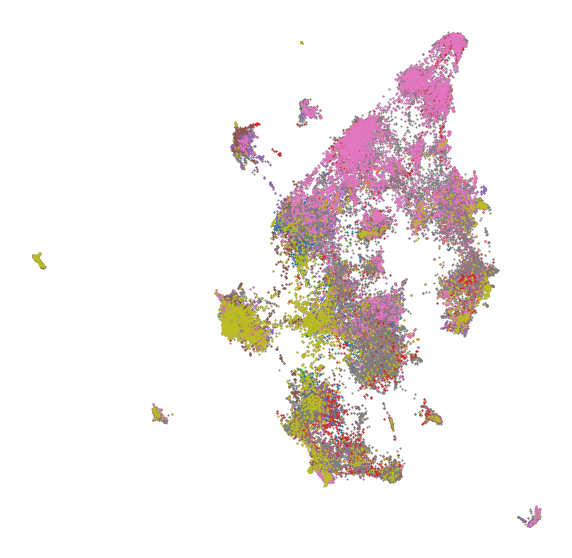

In [215]:
plt.figure(figsize=(10,10))

plt.scatter(embedding[:,0], embedding[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where(torch.stack(b)[:,i] & torch.stack(b).sum(axis=1) == 1)[0]
    plt.scatter(embedding[indices,0], embedding[indices,1], s=1)
plt.axis('off')

In [ ]:
ho = hm.run_harmony(a.numpy(), df, ['ID'])

In [ ]:
Z = ho.Z_corr.T
np.save('all_harmonized.npy', Z)

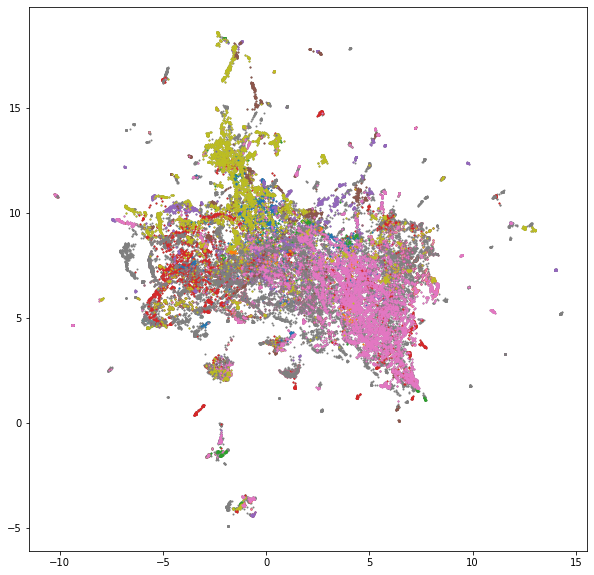

In [159]:
plt.figure(figsize=(10,10))

plt.scatter(embedding_all[:,0], embedding_all[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where(torch.stack(b)[:,i] & torch.stack(b).sum(axis=1) == 1)[0]
    plt.scatter(embedding_all[indices,0], embedding_all[indices,1], s=1)

In [149]:
torch.stack(b).sum(axis=1).shape

torch.Size([43317])

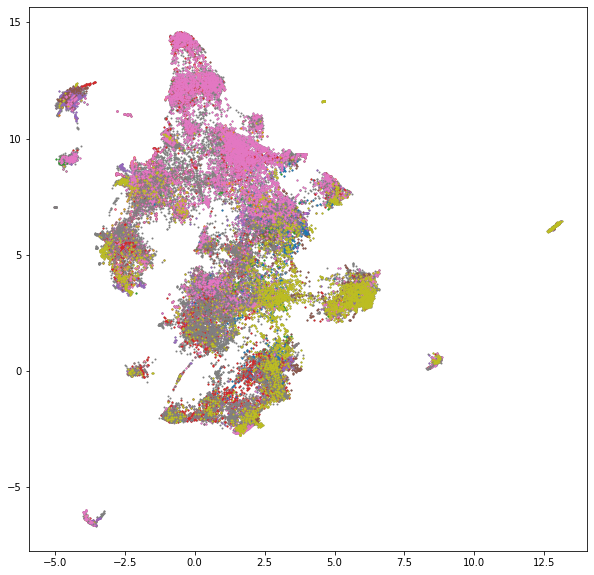

In [158]:
Z = ho.Z_corr.T
plt.figure(figsize=(10,10))

plt.scatter(embedding[:,0], embedding[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where(torch.stack(b)[:,i] & torch.stack(b).sum(axis=1) == 1)[0]
    plt.scatter(embedding[indices,0], embedding[indices,1], s=1)

In [6]:
from sklearn.decomposition import PCA

In [7]:
pca = PCA(n_components=a.shape[1], svd_solver='full')

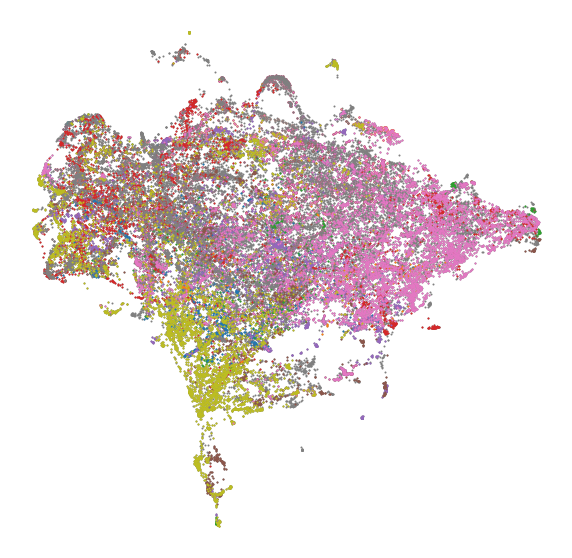

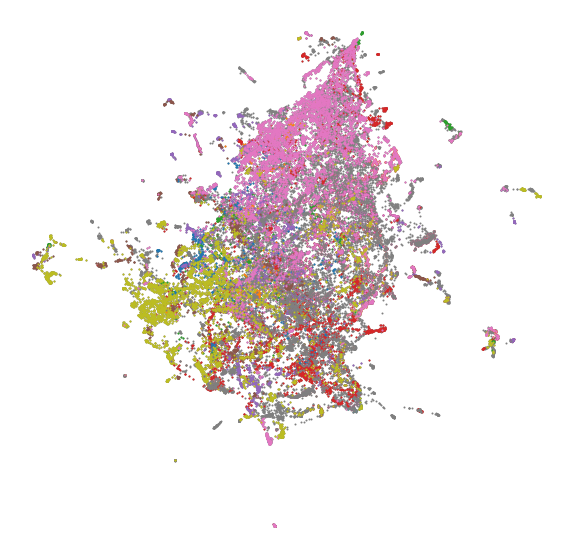

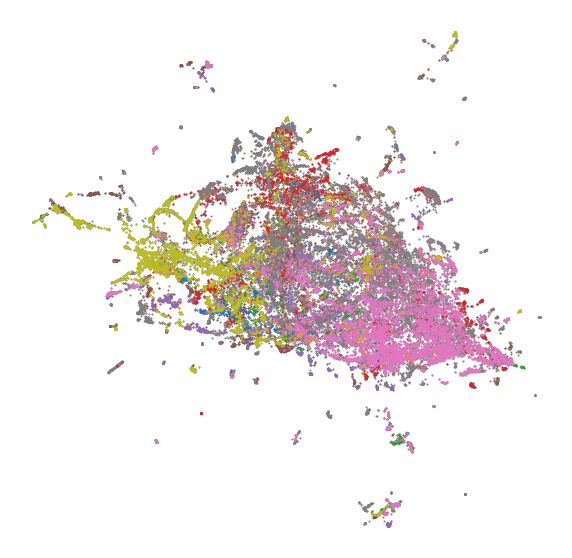

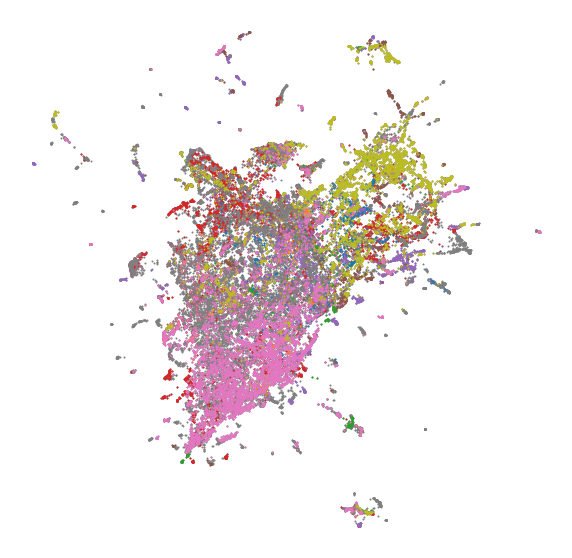

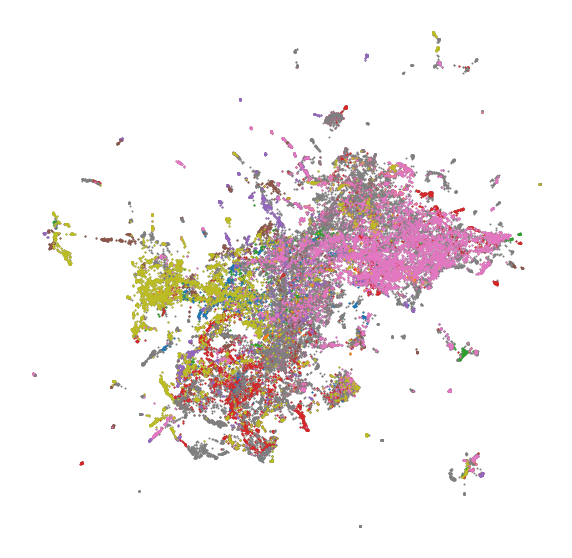

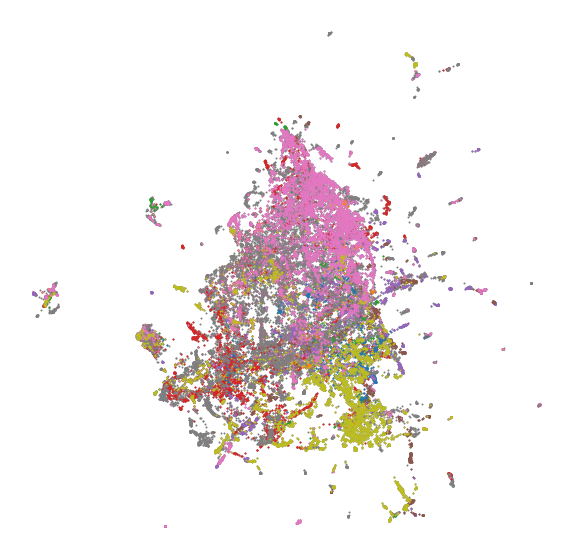

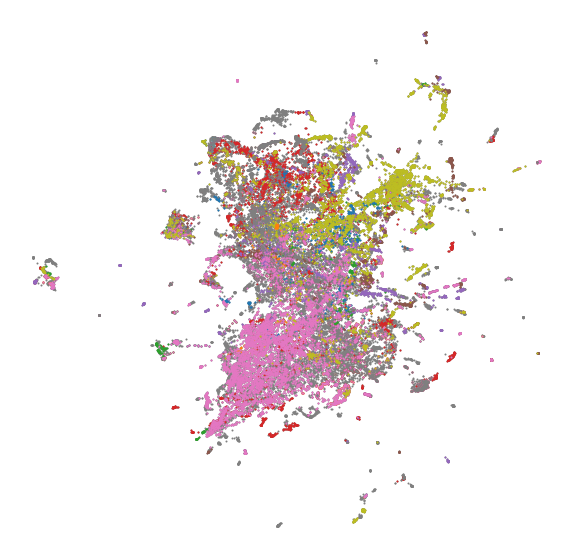

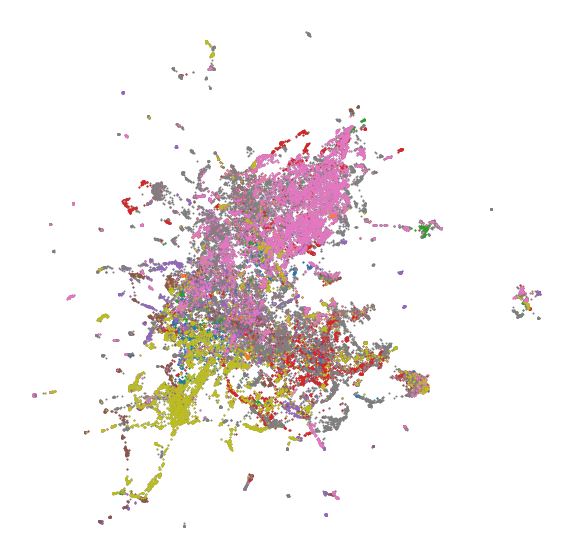

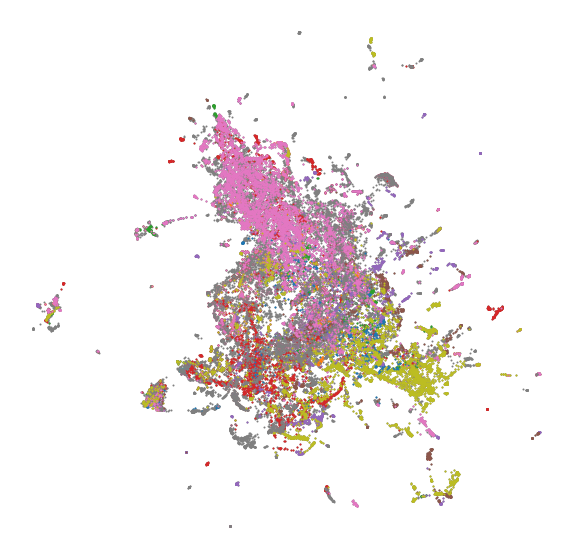

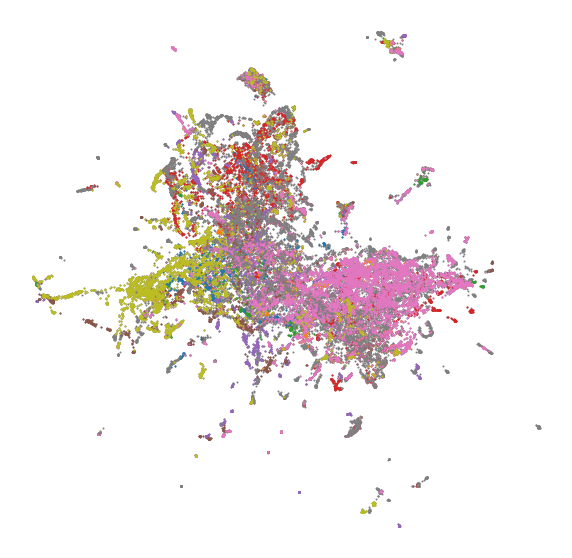

In [206]:
pca = PCA(n_components=a.shape[1], svd_solver='full')
for i in range(10, 110, 10):
    transformed_a = pca.fit_transform(a.numpy())
    transformed_a[:,i:] = 0
    inversed_a = pca.inverse_transform(transformed_a)
    reducer = umap.UMAP()
    inversed_embedding = reducer.fit_transform(inversed_a)
    plt.figure(figsize=(10,10))
    plt.scatter(inversed_embedding[:,0], inversed_embedding[:,1], s=1, color='grey')
    for i in range(19):
        indices = np.where(torch.stack(b)[:,i] & torch.stack(b).sum(axis=1) == 1)[0]
        plt.scatter(inversed_embedding[indices,0], inversed_embedding[indices,1], s=1)
    plt.axis('off')

/scr/mdoron/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


TypeError: stack(): argument 'tensors' (position 1) must be tuple of Tensors, not Tensor

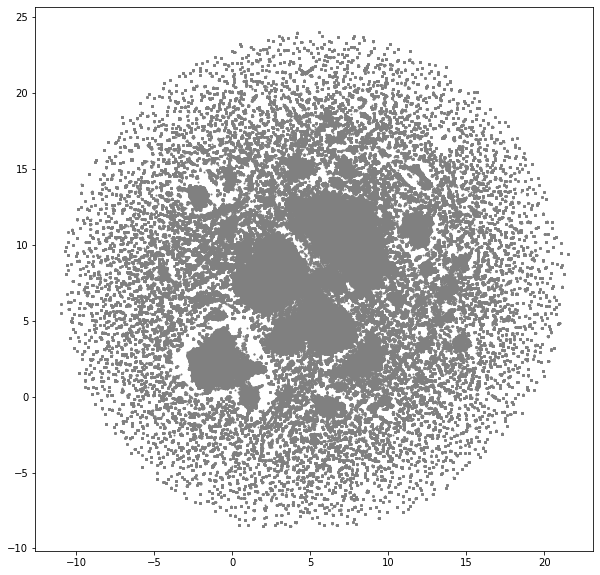

In [8]:
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(a.numpy())
plt.figure(figsize=(10,10))
plt.scatter(inversed_embedding[:,0], inversed_embedding[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where((b)[:,i] & (b).sum(axis=1) == 1)[0]
    plt.scatter(inversed_embedding[indices,0], inversed_embedding[indices,1], s=1)
plt.axis('off')

In [11]:
transformed_a = pca.fit_transform(a.numpy())
transformed_a[:,50:] = 0
inversed_a = pca.inverse_transform(transformed_a)
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(inversed_a)
plt.figure(figsize=(10,10))
plt.scatter(inversed_embedding[:,0], inversed_embedding[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where((b)[:,i] & (b).sum(axis=1) == 1)[0]
    plt.scatter(inversed_embedding[indices,0], inversed_embedding[indices,1], s=1)
plt.axis('off')


KeyboardInterrupt



In [46]:
A549_features = a[np.where(df.cell_type == 'A549')[0],:]
A549_proteins = b[np.where(df.cell_type == 'A549')[0],:]

In [ ]:
transformed_a = pca.fit_transform(a.numpy())
# transformed_a[:,20:] = 0
inversed_a = pca.inverse_transform(transformed_a)
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(inversed_a)
plt.figure(figsize=(10,10))
plt.scatter(inversed_embedding[:,0], inversed_embedding[:,1], s=1, color='grey')
for i in range(19):
    indices = np.where((b)[:,i] & (b).sum(axis=1) == 1)[0]
    plt.scatter(inversed_embedding[indices,0], inversed_embedding[indices,1], s=1)
plt.axis('off')

/scr/mdoron/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [47]:
A549_features = ((A549_features - A549_features.mean(axis=0)) / A549_features.std(axis=0))


In [49]:
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(A549_features)


/scr/mdoron/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


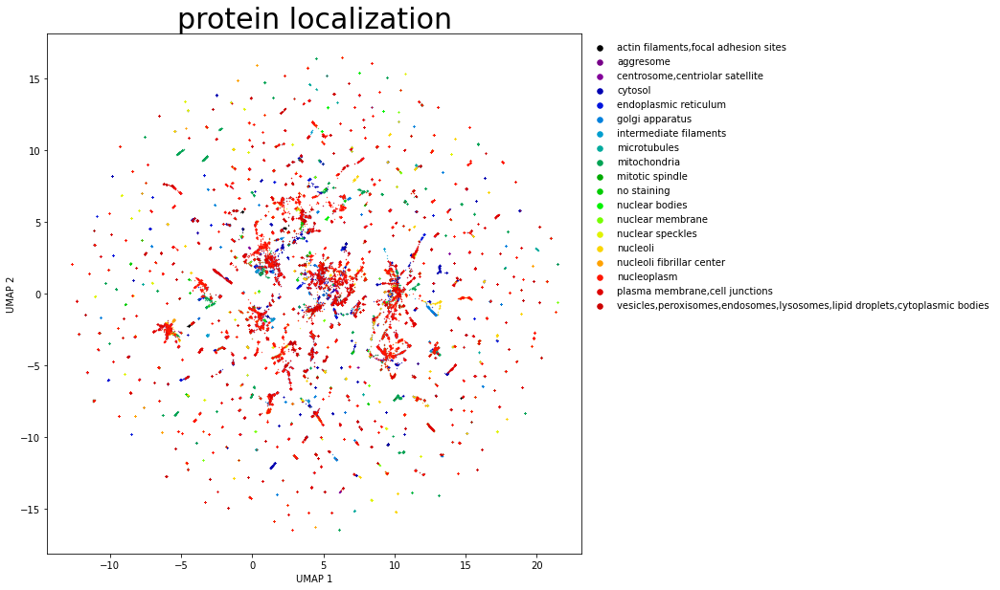

In [51]:
plot_UMAP(df[df.cell_type == 'A549'], protein_to_num_single_cells, inversed_embedding, 'protein localization')

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_758,feature_759,feature_760,feature_761,feature_762,feature_763,feature_764,feature_765,feature_766,feature_767
0,0.518555,0.870149,0.776620,0.933313,1.383660,-1.942163,-0.182711,-0.287162,-0.575709,-0.147660,...,0.111274,0.160927,0.268345,-0.761987,0.335049,1.341975,2.193477,0.884753,1.560347,0.567254
1,0.321598,0.578693,1.279275,-0.060750,1.805343,-0.884524,-0.810366,-0.454384,-2.138987,0.438817,...,0.128290,0.585721,-0.336677,0.669683,0.394428,0.031696,1.825985,0.772642,1.016395,-0.198390
2,0.359750,0.462960,1.938156,-0.458778,0.854158,-0.671072,-0.241375,-1.015259,-3.232742,0.503597,...,-0.190147,0.986553,-0.396622,-0.254872,1.078680,-0.721475,1.979064,0.316088,2.116007,0.287245
3,0.966663,0.122148,2.402242,-0.727672,1.538358,-1.069813,-0.767578,0.515076,-2.182097,0.393993,...,0.362780,0.616626,-0.012900,0.120380,1.148591,0.928223,1.714261,0.884386,1.252930,-0.110652
4,0.407438,0.005453,1.305686,0.573197,2.505913,-0.953821,-1.062918,0.166599,-1.670211,0.348656,...,-0.058519,0.396142,-1.203644,-0.033321,0.120283,0.613385,2.091957,-0.487087,2.037076,0.153290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1134880,-1.657384,0.816865,1.080451,0.411092,-1.525532,1.508222,1.640541,0.200324,-0.711193,-0.875254,...,-1.137387,-0.193685,0.885610,-0.765850,0.416640,0.987544,-0.141145,0.324710,0.155085,-1.128900
1134881,-1.478279,0.010552,-0.175126,-0.324821,-2.078011,1.126689,1.545735,-0.553706,-1.102595,-0.024610,...,-2.125335,1.152855,1.000104,-2.231471,0.054207,0.443403,-1.236161,0.699821,-0.178822,0.195027
1134882,-1.087062,-0.004579,-0.252003,0.359257,-2.469797,0.213606,2.259036,0.711191,-0.621437,-0.616901,...,-1.773143,-0.322047,1.758041,-1.863253,-0.765826,-0.514157,-0.260760,-1.085546,1.660845,0.179185
1134883,-0.521674,0.282451,0.686732,0.363032,-0.754438,1.529208,1.805514,-1.437901,-0.212472,-0.580816,...,-1.445862,0.070125,1.718429,-1.036837,0.907880,0.400845,-0.988486,0.350239,0.330617,-0.611399


In [68]:
df = pd.read_csv('/scr/mdoron/Dino4Cells/data/fixed_size_masked_single_cells_master.csv')

In [69]:
features_df = pd.concat((df, pd.DataFrame(features, columns = [f'feature_{i}' for i in range(features.shape[1])])), axis=1)

In [71]:
mean_features = features_df.groupby('ID').mean()[[f'feature_{i}' for i in range(features.shape[1])]]

In [77]:
IDs = mean_features.index.values
mean_features = mean_features.values

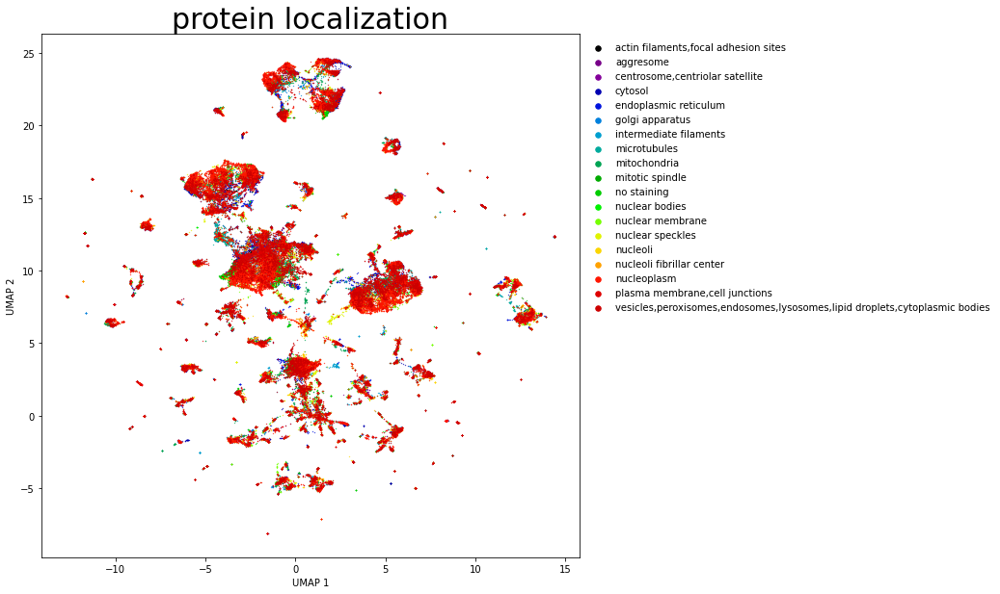

In [81]:
reducer = umap.UMAP()
inversed_embedding = reducer.fit_transform(mean_features)



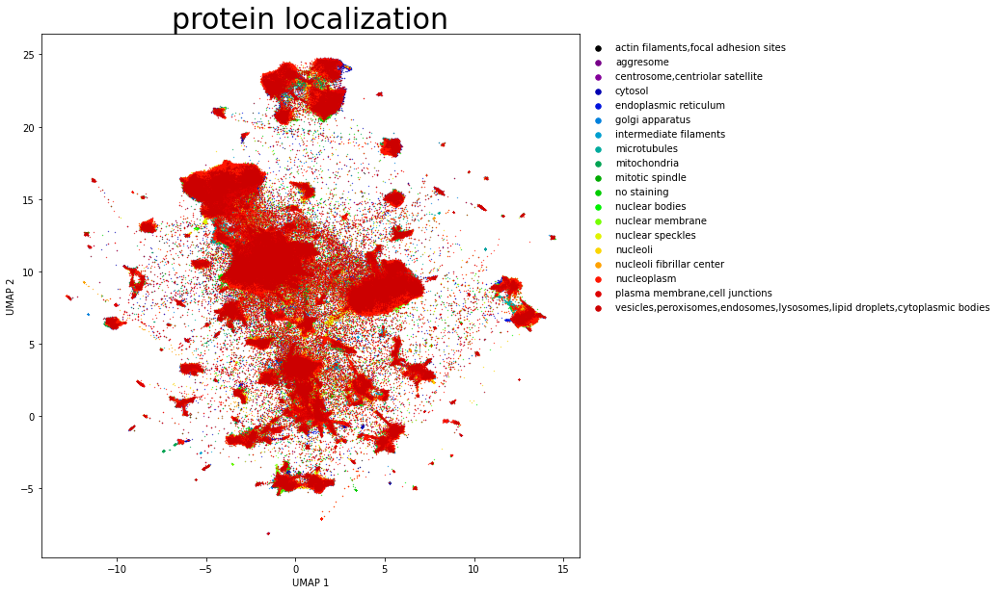

In [82]:

plot_UMAP(df, ['cell_type'], reducer.transform(features), 'Cell line')